# Librarian's quest to exhaustivity and openness

## Analyse of merged Data from AoU, PubMed and OpenAlex

Project for the EAHIL conference 2024 : https://eahil2024.rsu.lv/

Authors : **Floriane Muller & Pablo Iriarte**, University of Geneva  
Last update : 10.06.2024  


With our research, we intend to: 

1.	Observe data sharing trends in publications by authors affiliated with our institution: are they sharing data more than in the past? are they sharing in supplementary files or in research data repositories? which data repositories? Are those trends comparable with data from other institutions or publishers? is there any noticeable variation between clinical, basic or dental medicine disciplines? 

2.	Identify publications that are missing in our repository, and seek common patterns amongst them: is there any reason or logical explanation for their absence? Are they not deposited in the repository because they cannot be made Open Access? Or on the opposite, because, being OA, authors do not feel the need to deposit them?

### Sources

* AoU publications merged with PubMed publications from UNIGE and OpenAlex publications from UNIGE

In [119]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.ticker as mtick
from matplotlib_venn import venn2, venn3, venn2_circles, venn3_circles
%matplotlib inline
# display the full content of rows (non truncated)
pd.set_option('display.max_colwidth', None)
# display all the columns
pd.set_option('display.max_columns', None)

# parameters
myfolder_results = 'results/2024/'
myfolder_temp = 'data/temp/2024/'
myfolder_figures = 'figures/2024/'

export_856 = myfolder_results + 'aou_856.tsv'
export_773 = myfolder_temp + 'aou_773t.tsv'
export_aou_pmids = myfolder_temp + 'aou_pmids.tsv'
export_pubmed = myfolder_results + 'pubmed_all.tsv'

plos_source = 'data/sources/PLOS-Dataset_v6_Mar24.csv'
plos_comparator_source = 'data/sources/Comparator-Dataset_v6_Mar24.csv'


## Final dataframe

In [2]:
df = pd.read_csv(myfolder_results + 'aou_pubmed_openalex.tsv', delimiter='\t', header=0)
df

,ID_AOU,DATE_AOU,BIOMED_AOU,DISCIPLINE_CLINICAL_AOU,DISCIPLINE_BASIC_AOU,DISCIPLINE_BIOLOGY_AOU,DISCIPLINE_PHARMA_AOU,DISCIPLINE_AFFECTIVE_AOU,DISCIPLINE_DENTISTRY_AOU,DISCIPLINE_MEDICINE_GENERAL_AOU,DISCIPLINE_NEUROSCIENCES_AOU,DATA_AOU,DATA_TYPE_APPENDIXES_AOU,DATA_TYPE_DATA_SUPPLEMENTS_AOU,DATA_TYPE_SHARED_DATA_AOU,FUNDER_AOU,FNS_FUNDER_AOU,EU_FUNDER_AOU,DOC_TYPE_AOU,DOI,PMID,AOU,PUBMED,DATA_PUBMED,OPENALEX,ID_OPENALEX,IS_OA_OPENALEX,OA_STATUS_OPENALEX,DATE_OPENALEX,DATE_PUBMED,DATE
0,unige:94273,2017.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,Thèse,10.13097/ARCHIVE-OUVERTE/UNIGE:94273,23775053,1,0,0.0,0,NaN,NaN,NaN,0.0,NaN,2017.0
1,unige:29525,2015.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Article scientifique,10.1016/J.PSYCHRES.2013.06.032,23870492,1,0,0.0,0,NaN,NaN,NaN,0.0,NaN,2015.0
2,unige:35523,2015.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Article scientifique,10.1111/VOP.12137,24373539,1,0,0.0,0,NaN,NaN,NaN,0.0,NaN,2015.0
3,unige:74670,2015.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Article scientifique,10.1597/13-145,24437562,1,0,0.0,0,NaN,NaN,NaN,0.0,NaN,2015.0
4,unige:74675,2015.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Article scientifique,10.1597/13-080,24437563,1,0,0.0,0,NaN,NaN,NaN,0.0,NaN,2015.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34704683,0,0,NaN,1,W4286892492,False,closed,2021.0,NaN,2021.0
30992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34704682,0,0,NaN,1,W4286892578,False,closed,2021.0,NaN,2021.0
30993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34585859,0,0,NaN,1,W4286953485,False,closed,2021.0,NaN,2021.0
30994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34431641,0,0,NaN,1,W4287020831,False,closed,2021.0,NaN,2021.0


## Q1A - Observe data sharing trends in publications by authors affiliated with our institution: are they sharing data more than in the past?

In [3]:
# AoU data
aou = pd.read_csv(myfolder_results + 'aou_all.tsv', delimiter='\t', header=0)

In [4]:
# add counts
aou.loc[((aou['BIOMED'] == 1) & (aou['DATA'] == 1)), 'BIOMED_DATA'] = 1
aou.loc[((aou['BIOMED'] == 1) & (aou['DATA'] == 0)), 'BIOMED_NOT_DATA'] = 1
aou.loc[(aou['DATA'] == 0), 'NOT_DATA'] = 1
aou['ALL'] = 1
aou = aou.fillna(0)
aou['BIOMED_DATA'] = aou['BIOMED_DATA'].astype(int)
aou['BIOMED_NOT_DATA'] = aou['BIOMED_NOT_DATA'].astype(int)
aou['NOT_DATA'] = aou['NOT_DATA'].astype(int)
aou

,id,date,BIOMED,discipline_clinical,discipline_basic,discipline_biology,discipline_pharma,discipline_affective,discipline_dentistry,discipline_medicine_general,discipline_neurosciences,DATA,DATA_TYPE_appendixes,DATA_TYPE_data_supplements,DATA_TYPE_shared_data,FUNDER,FNS_FUNDER,EU_FUNDER,type,BIOMED_DATA,BIOMED_NOT_DATA,NOT_DATA,ALL
0,unige:1,2008,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1
1,unige:2,2008,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,0,1,1
2,unige:3,2008,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1
3,unige:4,2008,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1
4,unige:5,2008,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109004,unige:167398,2022,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1
109005,unige:167399,2023,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1
109006,unige:167400,2023,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,Article scientifique,1,0,0,1
109007,unige:167401,2022,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1


In [5]:
# check biomed not data
aou.loc[(aou['BIOMED'] == 1) & (aou['DATA'] == 0)]

,id,date,BIOMED,discipline_clinical,discipline_basic,discipline_biology,discipline_pharma,discipline_affective,discipline_dentistry,discipline_medicine_general,discipline_neurosciences,DATA,DATA_TYPE_appendixes,DATA_TYPE_data_supplements,DATA_TYPE_shared_data,FUNDER,FNS_FUNDER,EU_FUNDER,type,BIOMED_DATA,BIOMED_NOT_DATA,NOT_DATA,ALL
0,unige:1,2008,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1
2,unige:3,2008,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1
3,unige:4,2008,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1
4,unige:5,2008,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1
5,unige:6,2008,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109001,unige:167395,2021,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Article professionnel,0,1,1,1
109002,unige:167396,2021,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1
109004,unige:167398,2022,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1
109005,unige:167399,2023,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,0,1,1,1


In [6]:
# check data not biomed
aou.loc[(aou['BIOMED'] == 0) & (aou['DATA'] == 1)]

,id,date,BIOMED,discipline_clinical,discipline_basic,discipline_biology,discipline_pharma,discipline_affective,discipline_dentistry,discipline_medicine_general,discipline_neurosciences,DATA,DATA_TYPE_appendixes,DATA_TYPE_data_supplements,DATA_TYPE_shared_data,FUNDER,FNS_FUNDER,EU_FUNDER,type,BIOMED_DATA,BIOMED_NOT_DATA,NOT_DATA,ALL
468,unige:167476,2015,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,Article scientifique,0,0,0,1
658,unige:167704,2023,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,Article professionnel,0,0,0,1
702,unige:167748,2023,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,Thèse,0,0,0,1
757,unige:167805,2023,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,Master,0,0,0,1
770,unige:167818,2023,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,Thèse,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108703,unige:167061,2016,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,Article scientifique,0,0,0,1
108902,unige:167273,2023,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,Article scientifique,0,0,0,1
108907,unige:167278,2018,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,Article scientifique,0,0,0,1
108940,unige:167331,2014,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,Article scientifique,0,0,0,1


In [7]:
# total per year
aou_counts = aou.groupby(['date']).sum()
aou_counts = aou_counts.fillna(0)
aou_counts['BIOMED_DATA'] = aou_counts['BIOMED_DATA'].astype(int)
aou_counts['BIOMED_NOT_DATA'] = aou_counts['BIOMED_NOT_DATA'].astype(int)
aou_counts['NOT_DATA'] = aou_counts['NOT_DATA'].astype(int)
aou_counts

id  \
date                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

In [8]:
# same for biomed
aou_biomed_counts = aou.loc[aou['BIOMED'] == 1].groupby(['date']).sum()
del aou_biomed_counts['ALL']
aou_biomed_counts = aou_biomed_counts.fillna(0)
aou_biomed_counts['BIOMED_DATA'] = aou_biomed_counts['BIOMED_DATA'].astype(int)
aou_biomed_counts['BIOMED_NOT_DATA'] = aou_biomed_counts['BIOMED_NOT_DATA'].astype(int)
aou_biomed_counts['NOT_DATA'] = aou_biomed_counts['NOT_DATA'].astype(int)
aou_biomed_counts

id  \
date                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

In [9]:
# export CSV
aou_counts.to_csv(myfolder_results + 'aou_counts_by_year.tsv', sep='\t')
aou_biomed_counts.to_csv(myfolder_results + 'aou_biomed_counts_by_year.tsv', sep='\t')

In [10]:
# exports excel
aou_counts.to_excel(myfolder_results + 'aou_counts_by_year.xlsx', index=True)
aou_biomed_counts.to_excel(myfolder_results + 'aou_biomed_counts_by_year.xlsx', index=True)

In [11]:
# counts
aou_total = aou.shape[0]
biomed = aou.loc[aou['BIOMED'] == 1].shape[0]
not_biomed = aou.loc[aou['BIOMED'] == 0].shape[0]
print ('AoU total: ' + str(aou_total))
print ('Biomed refs: ' + str(biomed))
print ('Ratio: ' + str(biomed) + ' / ' + str(aou_total) + ' = ' + str(biomed/aou_total))

AoU total: 109009
Biomed refs: 45428
Ratio: 45428 / 109009 = 0.4167362327881184


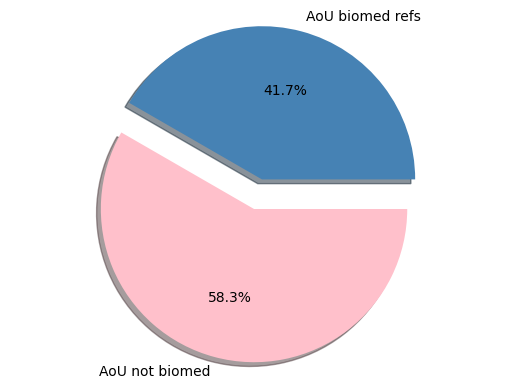

In [12]:
# pie chart 1
myfileoutfig = myfolder_figures + 'aou_biomed_pie_chart.png'
labels = 'AoU biomed refs', 'AoU not biomed'
sizes = [biomed, not_biomed]
explode = (0.1, 0.1)
colors = ['steelblue', 'pink']
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=0, colors=colors)
ax1.axis('equal')
fig1.savefig(myfileoutfig, dpi=100)
plt.show()

In [13]:
# counts 2015-2022
aou_2015_2022 = aou.loc[(aou['date'] > 2014) & (aou['date'] < 2023)]
aou_total_2015_2022 = aou_2015_2022.shape[0]
biomed_2015_2022 = aou_2015_2022.loc[aou_2015_2022['BIOMED'] == 1].shape[0]
not_biomed_2015_2022 = aou_2015_2022.loc[aou_2015_2022['BIOMED'] == 0].shape[0]
print ('AoU total: ' + str(aou_total_2015_2022))
print ('Biomed refs: ' + str(biomed_2015_2022))
print ('Ratio: ' + str(biomed_2015_2022) + ' / ' + str(aou_total_2015_2022) + ' = ' + str(biomed_2015_2022/aou_total_2015_2022))

AoU total: 41785
Biomed refs: 19319
Ratio: 19319 / 41785 = 0.46234294603326553


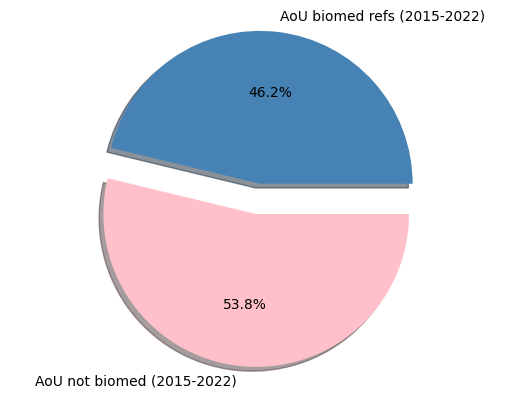

In [14]:
# pie chart 2
myfileoutfig = myfolder_figures + 'aou_biomed_pie_chart_2015_2022.png'
labels = 'AoU biomed refs (2015-2022)', 'AoU not biomed (2015-2022)'
sizes = [biomed_2015_2022, not_biomed_2015_2022]
explode = (0.1, 0.1)
colors = ['steelblue', 'pink']
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=0, colors=colors)
ax1.axis('equal')
fig1.savefig(myfileoutfig, dpi=100)
plt.show()

In [15]:
# counts
aou_total = aou.shape[0]
data = aou.loc[aou['DATA'] == 1].shape[0]
not_data = aou.loc[aou['DATA'] == 0].shape[0]
print ('AoU total: ' + str(aou_total))
print ('Refs sharing data: ' + str(data))
print ('Ratio: ' + str(data) + ' / ' + str(aou_total) + ' = ' + str(data/aou_total))

AoU total: 109009
Refs sharing data: 4192
Ratio: 4192 / 109009 = 0.038455540368226473


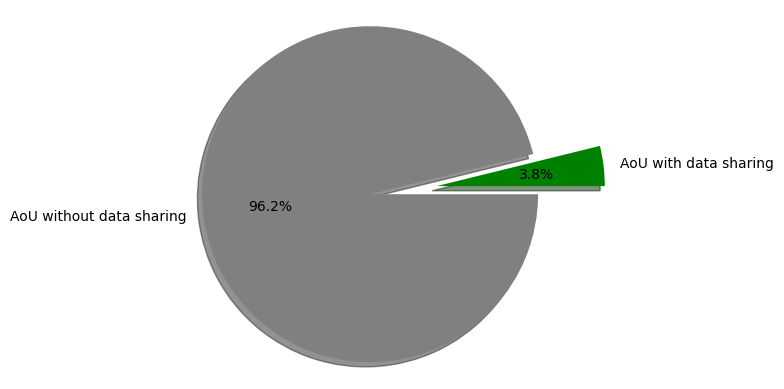

In [16]:
# pie chart 3
myfileoutfig = myfolder_figures + 'aou_data_pie_chart.png'
labels = 'AoU with data sharing', 'AoU without data sharing'
sizes = [data, not_data]
explode = (0.2, 0.2)
colors = ['green', 'gray']
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=0, colors=colors)
ax1.axis('equal')
fig1.savefig(myfileoutfig, dpi=100)
plt.show()

In [17]:
# counts 2015-2022
aou_2015_2022 = aou.loc[(aou['date'] > 2014) & (aou['date'] < 2023)]
aou_total_2015_2022 = aou_2015_2022.shape[0]
data_2015_2022 = aou_2015_2022.loc[aou_2015_2022['DATA'] == 1].shape[0]
not_data_2015_2022 = aou_2015_2022.loc[aou_2015_2022['DATA'] == 0].shape[0]
print ('AoU total (2015-2022) : ' + str(aou_total_2015_2022))
print ('Refs sharing data (2015-2022) : ' + str(data_2015_2022))
print ('Ratio: ' + str(data_2015_2022) + ' / ' + str(aou_total_2015_2022) + ' = ' + str(data_2015_2022/aou_total_2015_2022))

AoU total (2015-2022) : 41785
Refs sharing data (2015-2022) : 3072
Ratio: 3072 / 41785 = 0.07351920545650353


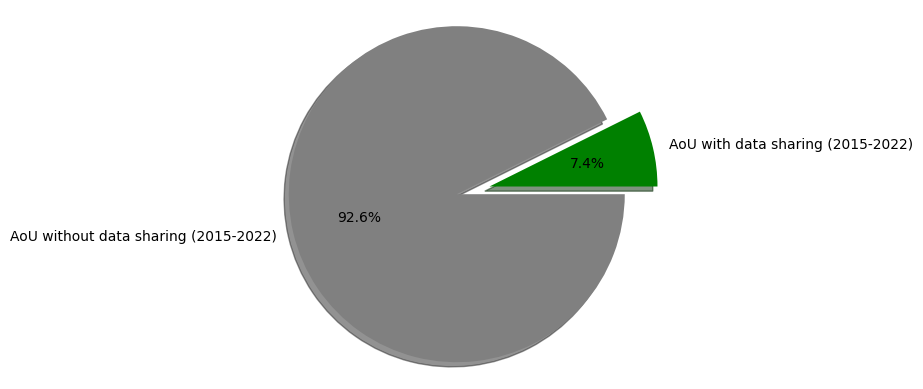

In [18]:
# pie chart 4
myfileoutfig = myfolder_figures + 'aou_data_pie_chart_2015_2022.png'
labels = 'AoU with data sharing (2015-2022)', 'AoU without data sharing (2015-2022)'
sizes = [data_2015_2022, not_data_2015_2022]
explode = (0.1, 0.1)
colors = ['green', 'gray']
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=0, colors=colors)
ax1.axis('equal')
fig1.savefig(myfileoutfig, dpi=100)
plt.show()

In [19]:
# counts BIOMED
aou_biomed_total = aou.loc[aou['BIOMED'] == 1].shape[0]
biomed_data = aou.loc[(aou['BIOMED'] == 1) & (aou['DATA'] == 1)].shape[0]
biomed_not_data = aou.loc[(aou['BIOMED'] == 1) & (aou['DATA'] == 0)].shape[0]
print ('AoU Biomed total: ' + str(aou_biomed_total))
print ('Refs Biomed sharing data: ' + str(biomed_data))
print ('Ratio: ' + str(biomed_data) + ' / ' + str(aou_biomed_total) + ' = ' + str(biomed_data/aou_biomed_total))

AoU Biomed total: 45428
Refs Biomed sharing data: 3224
Ratio: 3224 / 45428 = 0.07096944615655543


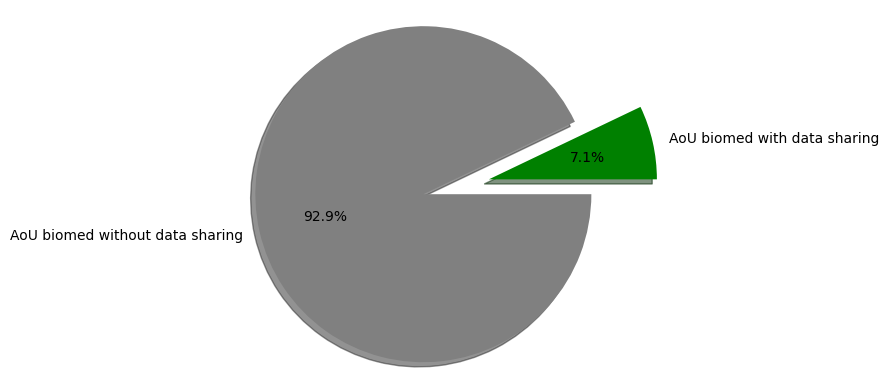

In [20]:
# pie chart 5
myfileoutfig = myfolder_figures + 'aou_biomed_data_pie_chart.png'
labels = 'AoU biomed with data sharing', 'AoU biomed without data sharing'
sizes = [biomed_data, biomed_not_data]
explode = (0.2, 0.2)
colors = ['green', 'gray']
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=0, colors=colors)
ax1.axis('equal')
fig1.savefig(myfileoutfig, dpi=100)
plt.show()

In [21]:
# counts BIOMED 2015-2022
aou_biomed_2015_2022 = aou.loc[(aou['date'] > 2014) & (aou['date'] < 2023) & (aou['BIOMED'] == 1)]
aou_biomed_total_2015_2022 = aou_biomed_2015_2022.shape[0]
biomed_data_2015_2022 = aou_biomed_2015_2022.loc[aou_biomed_2015_2022['DATA'] == 1].shape[0]
biomed_not_data_2015_2022 = aou_biomed_2015_2022.loc[aou_biomed_2015_2022['DATA'] == 0].shape[0]
print ('AoU biomed total (2015-2022) : ' + str(aou_biomed_total_2015_2022))
print ('Refs biomed sharing data (2015-2022) : ' + str(biomed_data_2015_2022))
print ('Ratio: ' + str(biomed_data_2015_2022) + ' / ' + str(aou_biomed_total_2015_2022) + ' = ' + str(biomed_data_2015_2022/aou_biomed_total_2015_2022))

AoU biomed total (2015-2022) : 19319
Refs biomed sharing data (2015-2022) : 2459
Ratio: 2459 / 19319 = 0.12728402091205548


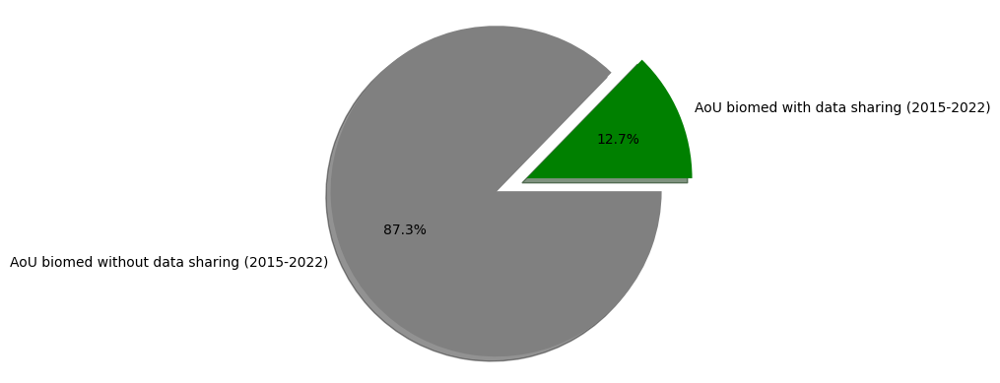

In [22]:
# pie chart 6
myfileoutfig = myfolder_figures + 'aou_biomed_data_pie_chart_2015_2022.png'
labels = 'AoU biomed with data sharing (2015-2022)', 'AoU biomed without data sharing (2015-2022)'
sizes = [biomed_data_2015_2022, biomed_not_data_2015_2022]
explode = (0.1, 0.1)
colors = ['green', 'gray']
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=0, colors=colors)
ax1.axis('equal')
fig1.savefig(myfileoutfig, dpi=100)
plt.show()

In [23]:
# biomed counts
aou_biomed_counts = aou_biomed_counts.reset_index()
aou_biomed_counts_by_year = aou_biomed_counts[['date', 'DATA', 'NOT_DATA']].set_index('date')
aou_biomed_counts_by_year

,DATA,NOT_DATA
date,,
1878,0,3
1879,0,2
1881,0,1
1882,0,5
1884,0,2
...,...,...
2020,526,2070
2021,724,1954
2022,694,1569


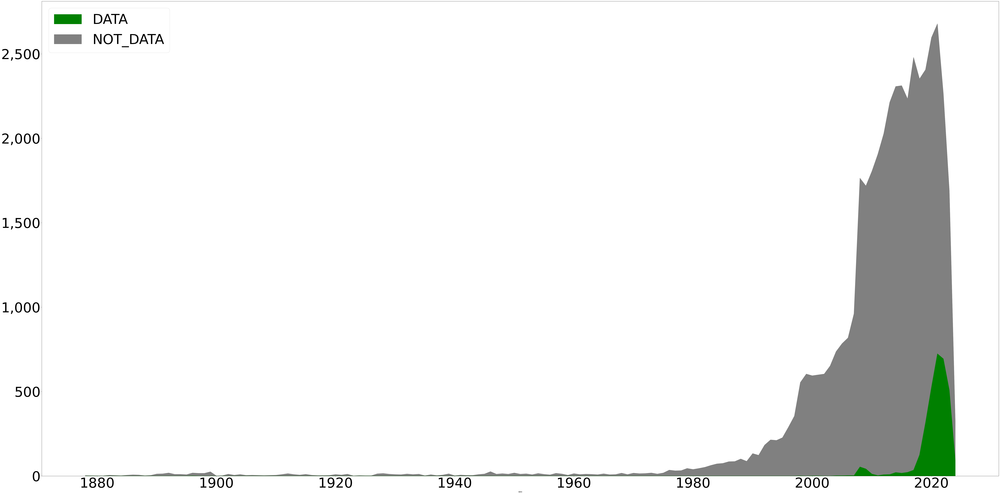

In [24]:
# plot year counts all
myfileoutfig = myfolder_figures + 'aou_biomed_data_counts_by_year.png'
ax = aou_biomed_counts_by_year.plot.area(fontsize=80, figsize=(100,50), color=('green', 'gray'), legend=True)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

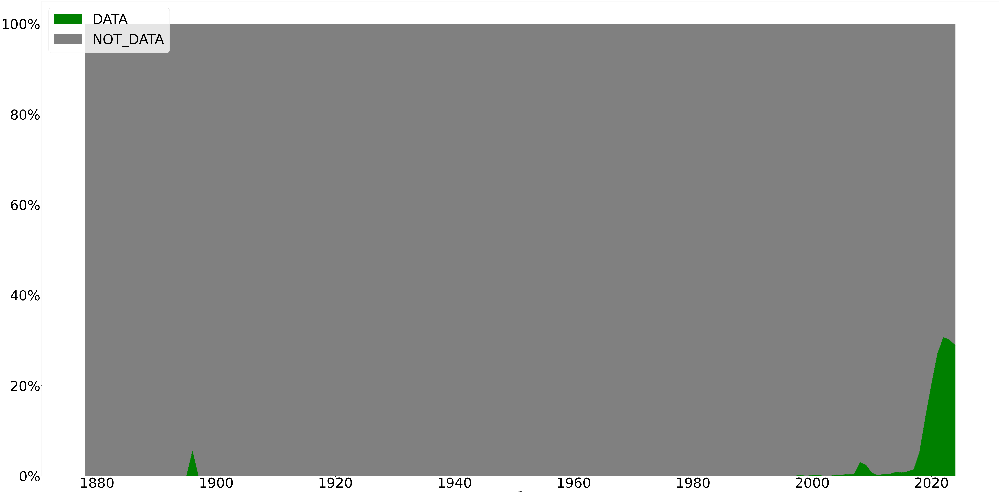

In [25]:
# convert data to percentage (fraction)
aou_biomed_counts_by_year_percent = aou_biomed_counts_by_year.divide(aou_biomed_counts_by_year.sum(axis=1), axis=0)
myfileoutfig = myfolder_figures + 'aou_biomed_data_counts_by_year_percent.png'
ax = aou_biomed_counts_by_year_percent.plot.area(fontsize=80, figsize=(100,50), legend=True, color=['green', 'gray'])
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

In [26]:
# biomed counts 2015-2022
aou_biomed_counts_by_year_2015_2022 = aou_biomed_counts.loc[(aou_biomed_counts['date'] > 2014) & (aou_biomed_counts['date'] < 2023)][['date', 'DATA', 'NOT_DATA']].set_index('date')
aou_biomed_counts_by_year_2015_2022

,DATA,NOT_DATA
date,,
2015,17,2295
2016,22,2211
2017,35,2444
2018,125,2227
2019,316,2090
2020,526,2070
2021,724,1954
2022,694,1569


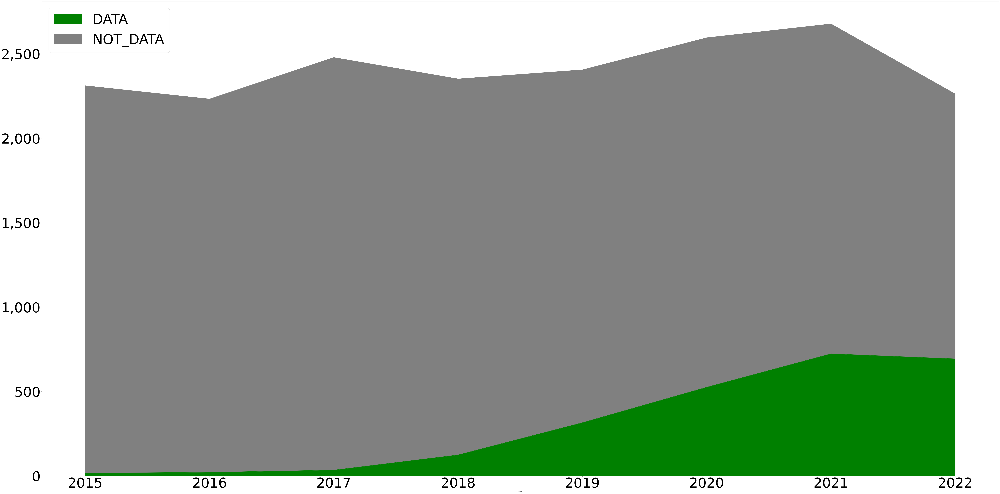

In [27]:
# plot year counts 2015-2022
myfileoutfig = myfolder_figures + 'aou_biomed_data_counts_by_year_2015_2022.png'
ax = aou_biomed_counts_by_year_2015_2022.plot.area(fontsize=80, figsize=(100,50), color=('green', 'gray'), legend=True)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

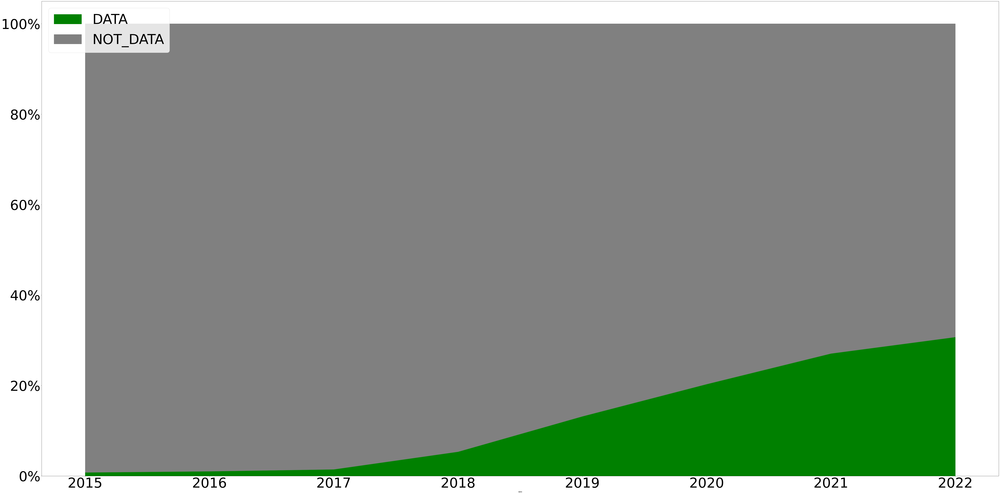

In [28]:
# convert data to percentage (fraction)
aou_biomed_counts_by_year_percent_2015_2022 = aou_biomed_counts_by_year_2015_2022.divide(aou_biomed_counts_by_year_2015_2022.sum(axis=1), axis=0)
myfileoutfig = myfolder_figures + 'aou_biomed_data_counts_by_year_percent_2015_2022.png'
ax = aou_biomed_counts_by_year_percent_2015_2022.plot.area(fontsize=80, figsize=(100,50), legend=True, color=['green', 'gray'])
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

## Q1B - Observe data sharing trends in publications by authors affiliated with our institution: are they sharing in supplementary files or in research data repositories? 

In [29]:
# list of 856 URLs: domains and filetypes for appendix, supplemental data and dataset (if DOI: add information by prefixes, and add the final URL)
df_856 = pd.read_csv(export_856, delimiter='\t', header=0)
df_856

,id,856_3,856_f,856_u,856_x,856_z,DATA,DATA_TYPE,date,BIOMED,discipline_clinical,discipline_basic,discipline_biology,discipline_pharma,discipline_affective,discipline_dentistry,discipline_medicine_general,discipline_neurosciences,FUNDER,FNS_FUNDER,EU_FUNDER,type,856_domain,856_filetype
0,unige:1,Article (Published version),unige1.pdf,https://archive-ouverte.unige.ch/download/ffe949d9-6c84-4788-a8e6-241722598a0b,Restricted access,0,0,NaN,2008,1,0,0,0,1,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,PDF
1,unige:3,Article (Published version),unige3.pdf,https://archive-ouverte.unige.ch/download/c0ba4635-1fe3-401e-bb10-f9d466897290,Restricted access,0,0,NaN,2008,1,0,0,0,1,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,PDF
2,unige:4,Article (Published version),1-s2.0-S0022354916324418-main.pdf,https://archive-ouverte.unige.ch/download/e6dc92fa-edcf-4cd9-8233-e51820794b81,Restricted access,0,0,NaN,2008,1,0,0,0,1,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,PDF
3,unige:5,Article (Published version),11095_2007_Article_9429.pdf,https://archive-ouverte.unige.ch/download/a32f50bf-55cb-49fb-b0c9-2d677c1562b9,Public access,OA NATIONAL,0,NaN,2008,1,0,0,0,1,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,PDF
4,unige:6,Article,fulltext.pdf,https://archive-ouverte.unige.ch/download/470f409d-c487-4abe-9e93-d38081ce5059,Restricted access,0,0,NaN,2008,1,0,0,0,1,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,PDF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148000,unige:167401,Article (Published version),Article-scientifique-from-europePmc.pdf,https://archive-ouverte.unige.ch/download/8e3d7d5f-e0f1-4ad3-9b62-84e0448202eb,Public access,CC BY-4.0,0,NaN,2022,1,1,0,0,0,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,PDF
148001,unige:167401,Alternate edition,0,https://www.mdpi.com/1422-0067/23/23/14585,0,0,0,NaN,2022,1,1,0,0,0,0,0,0,0,0,0,0,Article scientifique,MDPI.COM,NaN
148002,unige:167402,Article (Published version),A 578. Assessing the androgenic and.pdf,https://archive-ouverte.unige.ch/download/2e32d627-2155-4b3f-8070-e7dc621f80fb,Restricted access,0,0,NaN,2023,1,1,0,0,0,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,PDF
148003,unige:167402,Appendix,cen14847-sup-0001-supmat.docx,https://archive-ouverte.unige.ch/download/0cbfb5cc-4f1f-4872-9903-0092ba800882,Public access,0,1,appendixes,2023,1,1,0,0,0,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,DOCX


In [30]:
df_856['type'].value_counts()

type
Article scientifique                                 107007
Chapitre de livre                                      8483
Thèse                                                  7214
Master                                                 6438
Chapitre d'actes                                       5159
Article professionnel                                  3731
Livre                                                  2000
Présentation / Intervention                            1382
Rapport de recherche                                   1270
Autre article                                          1077
Ouvrage collectif                                       718
Numéro de revue                                         556
Contribution à un dictionnaire / une encyclopédie       498
Actes de conférence                                     453
Working paper                                           421
Thèse de privat-docent                                  381
Rapport technique                  

In [31]:
df_856['DATA_TYPE'].value_counts()

DATA_TYPE
appendixes          3505
data supplements    2665
shared data         1397
Name: count, dtype: int64

In [32]:
df_856.loc[df_856['DATA_TYPE'].isna()]

,id,856_3,856_f,856_u,856_x,856_z,DATA,DATA_TYPE,date,BIOMED,discipline_clinical,discipline_basic,discipline_biology,discipline_pharma,discipline_affective,discipline_dentistry,discipline_medicine_general,discipline_neurosciences,FUNDER,FNS_FUNDER,EU_FUNDER,type,856_domain,856_filetype
0,unige:1,Article (Published version),unige1.pdf,https://archive-ouverte.unige.ch/download/ffe949d9-6c84-4788-a8e6-241722598a0b,Restricted access,0,0,NaN,2008,1,0,0,0,1,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,PDF
1,unige:3,Article (Published version),unige3.pdf,https://archive-ouverte.unige.ch/download/c0ba4635-1fe3-401e-bb10-f9d466897290,Restricted access,0,0,NaN,2008,1,0,0,0,1,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,PDF
2,unige:4,Article (Published version),1-s2.0-S0022354916324418-main.pdf,https://archive-ouverte.unige.ch/download/e6dc92fa-edcf-4cd9-8233-e51820794b81,Restricted access,0,0,NaN,2008,1,0,0,0,1,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,PDF
3,unige:5,Article (Published version),11095_2007_Article_9429.pdf,https://archive-ouverte.unige.ch/download/a32f50bf-55cb-49fb-b0c9-2d677c1562b9,Public access,OA NATIONAL,0,NaN,2008,1,0,0,0,1,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,PDF
4,unige:6,Article,fulltext.pdf,https://archive-ouverte.unige.ch/download/470f409d-c487-4abe-9e93-d38081ce5059,Restricted access,0,0,NaN,2008,1,0,0,0,1,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,PDF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147999,unige:167400,Alternate edition,0,https://academic.oup.com/ejendo/article/188/1/lvad001/6986589,0,0,0,NaN,2023,1,1,0,0,0,0,0,0,0,0,0,0,Article scientifique,ACADEMIC.OUP.COM,NaN
148000,unige:167401,Article (Published version),Article-scientifique-from-europePmc.pdf,https://archive-ouverte.unige.ch/download/8e3d7d5f-e0f1-4ad3-9b62-84e0448202eb,Public access,CC BY-4.0,0,NaN,2022,1,1,0,0,0,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,PDF
148001,unige:167401,Alternate edition,0,https://www.mdpi.com/1422-0067/23/23/14585,0,0,0,NaN,2022,1,1,0,0,0,0,0,0,0,0,0,0,Article scientifique,MDPI.COM,NaN
148002,unige:167402,Article (Published version),A 578. Assessing the androgenic and.pdf,https://archive-ouverte.unige.ch/download/2e32d627-2155-4b3f-8070-e7dc621f80fb,Restricted access,0,0,NaN,2023,1,1,0,0,0,0,0,0,0,0,0,0,Article scientifique,ARCHIVE-OUVERTE.UNIGE.CH,PDF


In [33]:
df_856['856_domain'].value_counts()

856_domain
ARCHIVE-OUVERTE.UNIGE.CH      110740
LINKINGHUB.ELSEVIER.COM         4814
LINK.SPRINGER.COM               2516
NCBI.NLM.NIH.GOV                1850
SCIENCEDIRECT.COM               1828
                               ...  
OPHI.ORG.UK                        1
JOURNAL.CIISS.NET                  1
LINKS.JSTOR.ORG                    1
MANAGEMENTINTERNATIONAL.CA         1
SERIES.FRANCOANGELI.IT             1
Name: count, Length: 3290, dtype: int64

In [34]:
df_856.loc[df_856['856_domain'].str.contains('DOI.ORG')]

,id,856_3,856_f,856_u,856_x,856_z,DATA,DATA_TYPE,date,BIOMED,discipline_clinical,discipline_basic,discipline_biology,discipline_pharma,discipline_affective,discipline_dentistry,discipline_medicine_general,discipline_neurosciences,FUNDER,FNS_FUNDER,EU_FUNDER,type,856_domain,856_filetype
660,unige:167429,Alternate edition,0,https://doi.org/10.5194/egusphere-egu23-6005,0,0,0,NaN,2023,0,0,0,0,0,0,0,0,0,0,0,0,Chapitre d'actes,DOI.ORG/10.5194,NaN
1182,unige:167783,Dataset,0,https://doi.org/10.5281/zenodo.5150443,0,0,1,shared data,2023,1,0,1,1,0,0,0,0,0,1,1,0,Article scientifique,DOI.ORG/10.5281,NaN
1621,unige:168062,Dataset,0,https://doi.org/10.5281/zenodo.7509571,0,0,1,shared data,2023,1,1,0,0,0,0,0,0,0,0,0,0,Article scientifique,DOI.ORG/10.5281,NaN
1636,unige:168071,Dataset,0,https://doi.org/10.5061/dryad.ngf1vhhvp,0,0,1,shared data,2023,1,0,1,0,0,0,0,0,1,1,1,0,Article scientifique,DOI.ORG/10.5061,NaN
1829,unige:168196,Dataset,0,https://doi.org/10.1080/09658211.2023.2191901,0,0,1,shared data,2023,0,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,DOI.ORG/10.1080,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147327,unige:167048,Dataset,0,https://doi.org/10.26037/yareta:ry65havvezhmnlwa2hzyvxv2ga,0,0,1,shared data,2022,1,1,1,0,0,0,0,0,0,1,1,0,Article scientifique,DOI.ORG/10.26037,NaN
147339,unige:167053,Dataset,0,https://doi.org/10.5281/zenodo.6645256,0,0,1,shared data,2022,1,1,0,0,0,0,0,0,0,1,1,0,Article scientifique,DOI.ORG/10.5281,NaN
147347,unige:167056,Dataset,0,https://doi.org/10.26037/yareta:naegejqvxzfwliu236pxn5lus4,0,0,1,shared data,2021,1,1,0,0,0,0,0,0,0,1,1,0,Article scientifique,DOI.ORG/10.26037,NaN
147815,unige:167278,Dataset,0,https://doi.org/10.1080/09538259.2018.1442784,0,0,1,shared data,2018,0,0,0,0,0,0,0,0,0,0,0,0,Article scientifique,DOI.ORG/10.1080,NaN


In [35]:
df_856['856_filetype'].value_counts()

856_filetype
PDF                          106867
DOCX                           1572
JPG                             615
XLSX                            607
ZIP                             277
DOC                             149
MP4                             135
TIF                              78
PNG                              54
AVI                              51
PPTX                             45
XLS                              37
CSV                              27
TIFF                             23
TXT                              22
MOV                              22
JPEG                             21
HTML                             18
GIF                              12
FILE1                            11
PPT                              10
XML                               7
EPS                               6
PS                                6
MPG                               6
RTF                               6
EPUB                              5
RAR            

In [36]:
df_856_data1 = df_856.loc[df_856['DATA_TYPE'] == 'shared data']
df_856_data2 = df_856.loc[(df_856['DATA_TYPE'] == 'appendixes') | (df_856['DATA_TYPE'] == 'data supplements')]

In [37]:
# exports
df_856_data1.to_csv(myfolder_results + 'aou_856_shared_data.tsv', sep='\t', index=False)
df_856_data2.to_csv(myfolder_results + 'aou_856_appendixes_and_data_supplements.tsv', sep='\t', index=False)
df_856_data1.to_excel(myfolder_results + 'aou_856_shared_data.xlsx', index=False)
df_856_data2.to_excel(myfolder_results + 'aou_856_appendixes_and_data_supplements.xlsx', index=False)

## Q1C - Observe data sharing trends in publications by authors affiliated with our institution: which data repositories? 

In [38]:
# counts by domaine
df_856 = df_856.fillna(0)
df_856_group_by_domain_and_date = df_856[['DATA', 'BIOMED', 'discipline_clinical', 'discipline_basic', 'discipline_biology', 'discipline_pharma', 'discipline_affective', 'discipline_dentistry', 'discipline_medicine_general', 'discipline_neurosciences', 'FUNDER', 'FNS_FUNDER', 'EU_FUNDER', '856_domain', 'date']].groupby(by=['856_domain', 'date']).sum()
df_856_group_by_domain_and_date

DATA  BIOMED  \
856_domain                             date                 
 CBI-BOOSTER.CH                        2023     0       0   
 DOI.ORG                               2019     1       1   
                                       2021     1       0   
                                       2022     1       0   
0-WWW-NCBI-NLM-NIH-GOV.BRUM.BEDS.AC.UK 2021     1       1   
...                                           ...     ...   
ZOOLOGICALLETTERS.BIOMEDCENTRAL.COM    2018     0       1   
ZSTRR.RECHT.CH                         2019     0       0   
                                       2021     0       0   
                                       2022     0       0   
ZUERCHER-LEHRHAUS.CH                   2006     0       0   

                                             discipline_clinical  \
856_domain                             date                        
 CBI-BOOSTER.CH                        2023                    0   
 DOI.ORG                               2019                    1   
                                       2021                    0   
                                       2022                    0   
0-WWW-NCBI-NLM-NIH-GOV.BRUM.BEDS.AC.UK 2021                    1   
...                                                          ...   
ZOOLOGICALLETTERS.BIOMEDCENTRAL.COM    2018                    0   
ZSTRR.RECHT.CH                         2019                    0   
                                       2021                    0   
                                       2022                    0   
ZUERCHER-LEHRHAUS.CH                   2006                    0   

                                             discipline_basic  \
856_domain                             date                     
 CBI-BOOSTER.CH                        2023                 0   
 DOI.ORG                               2019                 0   
                                       2021                 0   
                                       2022                 0   
0-WWW-NCBI-NLM-NIH-GOV.BRUM.BEDS.AC.UK 2021                 1   
...                                                       ...   
ZOOLOGICALLETTERS.BIOMEDCENTRAL.COM    2018                 0   
ZSTRR.RECHT.CH                         2019                 0   
                                       2021                 0   
                                       2022                 0   
ZUERCHER-LEHRHAUS.CH                   2006                 0   

                                             discipline_biology  \
856_domain                             date                       
 CBI-BOOSTER.CH                        2023                   0   
 DOI.ORG                               2019                   0   
                                       2021                   0   
                                       2022                   0   
0-WWW-NCBI-NLM-NIH-GOV.BRUM.BEDS.AC.UK 2021                   0   
...                                                         ...   
ZOOLOGICALLETTERS.BIOMEDCENTRAL.COM    2018                   1   
ZSTRR.RECHT.CH                         2019                   0   
                                       2021                   0   
                                       2022                   0   
ZUERCHER-LEHRHAUS.CH                   2006                   0   

                                             discipline_pharma  \
856_domain                             date                      
 CBI-BOOSTER.CH                        2023                  0   
 DOI.ORG                               2019                  1   
                                       2021                  0   
                                       2022                  0   
0-WWW-NCBI-NLM-NIH-GOV.BRUM.BEDS.AC.UK 2021                  0   
...                                                        ...   
ZOOLOGICALLETTERS.BIOMEDCENTRAL.COM    2018                  0   
ZSTRR.RECHT.CH                         2019           

In [39]:
# counts by domaine
df_856_group_by_domain = df_856[['DATA', 'BIOMED', 'discipline_clinical', 'discipline_basic', 'discipline_biology', 'discipline_pharma', 'discipline_affective', 'discipline_dentistry', 'discipline_medicine_general', 'discipline_neurosciences', 'FUNDER', 'FNS_FUNDER', 'EU_FUNDER', '856_domain']].groupby(by=['856_domain']).sum()
df_856_group_by_domain

,DATA,BIOMED,discipline_clinical,discipline_basic,discipline_biology,discipline_pharma,discipline_affective,discipline_dentistry,discipline_medicine_general,discipline_neurosciences,FUNDER,FNS_FUNDER,EU_FUNDER
856_domain,,,,,,,,,,,,,
CBI-BOOSTER.CH,0,0,0,0,0,0,0,0,0,0,0,0,0
DOI.ORG,3,1,1,0,0,1,0,0,0,0,1,1,0
0-WWW-NCBI-NLM-NIH-GOV.BRUM.BEDS.AC.UK,1,1,1,1,0,0,0,0,0,0,0,0,0
10.32474,0,0,0,0,0,0,0,0,0,0,0,0,0
10.4232,1,0,0,0,0,0,0,0,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZIKA.ISPM.UNIBE.CH,1,1,1,0,0,0,0,0,0,0,1,1,1
ZNATURFORSCH.COM,0,0,0,0,0,0,0,0,0,0,0,0,0
ZOOLOGICALLETTERS.BIOMEDCENTRAL.COM,0,1,0,0,1,0,0,0,0,0,1,1,0


In [40]:
# counts by filetype
df_856_group_by_filetype_and_date = df_856[['DATA', 'BIOMED', 'discipline_clinical', 'discipline_basic', 'discipline_biology', 'discipline_pharma', 'discipline_affective', 'discipline_dentistry', 'discipline_medicine_general', 'discipline_neurosciences', 'FUNDER', 'FNS_FUNDER', 'EU_FUNDER', '856_filetype', 'date']].groupby(by=['856_filetype', 'date']).sum()
df_856_group_by_filetype_and_date

DATA  BIOMED  discipline_clinical  discipline_basic  \
856_filetype date                                                        
0            1873     0       0                    0                 0   
             1883     0       0                    0                 0   
             1888     0       0                    0                 0   
             1889     0       0                    0                 0   
             1890     0       0                    0                 0   
...                 ...     ...                  ...               ...   
ZIP          2020    48      44                   33                16   
             2021    72      71                   60                23   
             2022    55      53                   43                15   
             2023    33      33                   24                12   
             2024     9       9                    7                 5   

                   discipline_biology  discipline_pharma  \
856_filetype date                                          
0            1873                   0                  0   
             1883                   0                  0   
             1888                   0                  0   
             1889                   0                  0   
             1890                   0                  0   
...                               ...                ...   
ZIP          2020                   4                  0   
             2021                   2                  1   
             2022                   3                  2   
             2023                   1                  0   
             2024                   1                  0   

                   discipline_affective  discipline_dentistry  \
856_filetype date                                               
0            1873                     0                     0   
             1883                     0                     0   
             1888                     0                     0   
             1889                     0                     0   
             1890                     0                     0   
...                                 ...                   ...   
ZIP          2020                     0                     0   
             2021                     1                     1   
             2022                     1                     0   
             2023                     0                     1   
             2024                     0                     0   

                   discipline_medicine_general  discipline_neurosciences  \
856_filetype date                                                          
0            1873                            0                         0   
             1883                            0                         0   
             1888                            0                         0   
             1889                            0                         0   
             1890                            0                         0   
...                                        ...                       ...   
ZIP          2020                            0                         0   
             2021                            0                         0   
             2022                            0                         0   
             2023                            0                         0   
             2024                            0                         0   

                   FUNDER  FNS_FUNDER  EU_FUNDER  
856_filetype date                                 
0            1873       0           0          0  
             1883       0           0          0  
             1888       0           0          0  
             1889       0           0          0  
             1890       0           0          0  
...                   ...         ...        ...  
ZIP          2020      25       

In [41]:
# counts by domaine
df_856_group_by_filetype = df_856[['DATA', 'BIOMED', 'discipline_clinical', 'discipline_basic', 'discipline_biology', 'discipline_pharma', 'discipline_affective', 'discipline_dentistry', 'discipline_medicine_general', 'discipline_neurosciences', 'FUNDER', 'FNS_FUNDER', 'EU_FUNDER', '856_filetype']].groupby(by=['856_filetype']).sum()
df_856_group_by_filetype

,DATA,BIOMED,discipline_clinical,discipline_basic,discipline_biology,discipline_pharma,discipline_affective,discipline_dentistry,discipline_medicine_general,discipline_neurosciences,FUNDER,FNS_FUNDER,EU_FUNDER
856_filetype,,,,,,,,,,,,,
0,1397,17785,12467,3225,1962,844,632,271,317,140,4707,4144,985
7Z,2,0,0,0,0,0,0,0,0,0,0,0,0
AVI,47,43,11,35,0,2,0,0,0,0,35,35,9
BMC DEVELOPMENTAL BIOLOGY,0,1,0,0,1,0,0,0,0,0,0,0,0
CONTENT,0,0,0,0,0,0,0,0,0,0,0,0,0
CSV,27,27,15,16,0,0,0,0,2,0,9,8,2
DOC,77,77,70,4,0,3,0,5,1,5,26,20,8
DOCX,1418,1394,1259,239,36,49,40,18,24,27,506,463,84
DTA,1,1,1,0,0,0,0,0,0,0,1,1,0


In [42]:
# exports
# csv
df_856_group_by_domain_and_date.to_csv(myfolder_results + 'df_856_group_by_domain_and_date.tsv', sep='\t', index=True)
df_856_group_by_domain.to_csv(myfolder_results + 'df_856_group_by_domain.tsv', sep='\t', index=True)
df_856_group_by_filetype_and_date.to_csv(myfolder_results + 'df_856_group_by_filetype_and_date.tsv', sep='\t', index=True)
df_856_group_by_filetype.to_csv(myfolder_results + 'df_856_group_by_filetype.tsv', sep='\t', index=True)
# excel
df_856_group_by_domain_and_date.to_excel(myfolder_results + 'df_856_group_by_domain_and_date.xlsx', index=True)
df_856_group_by_domain.to_excel(myfolder_results + 'df_856_group_by_domain.xlsx', index=True)
df_856_group_by_filetype_and_date.to_excel(myfolder_results + 'df_856_group_by_filetype_and_date.xlsx', index=True)
df_856_group_by_filetype.to_excel(myfolder_results + 'df_856_group_by_filetype.xlsx', index=True)

## Q1D - Observe data sharing trends in publications by authors affiliated with our institution: Are those trends comparable with data from other institutions or publishers?

Comparison with PLOS study data


In [43]:
# PLOS data
plos = pd.read_csv(plos_source, delimiter=',', header=0, usecols=['Publication_Year', 'Data_Shared', 'Repositories_data'])
plos

,Publication_Year,Data_Shared,Repositories_data
0,2023,NaN,NaN
1,2022,NaN,NaN
2,2023,NaN,NaN
3,2020,NaN,NaN
4,2023,NaN,NaN
...,...,...,...
107714,2019,Yes,NaN
107715,2021,Yes,NaN
107716,2021,Yes,NaN
107717,2022,Yes,NaN


In [44]:
# PLOS data
plos_comparator = pd.read_csv(plos_comparator_source, delimiter=',', header=0, usecols=['Publication_Year', 'Data_Shared', 'Repositories_data'])
plos_comparator

,Publication_Year,Data_Shared,Repositories_data
0,2023,Yes,"Zenodo, EuropeanVariationArchive, Github, ENAorEBISequenceReadArchive"
1,2018,No,NaN
2,2023,Yes,OpenScienceFramework
3,2023,No,NaN
4,2018,Yes,NaN
...,...,...,...
22078,2023,No,NaN
22079,2023,No,NaN
22080,2023,No,NaN
22081,2023,No,NaN


In [45]:
plos['PLOS'] = 1
plos.loc[plos['Data_Shared'] == 'Yes', 'PLOS DATA'] = 1
plos['DATA'] = plos['PLOS DATA'].fillna(0)
plos.loc[plos['Repositories_data'].notna(), 'PLOS REPO'] = 1
plos['REPO'] = plos['PLOS REPO'].fillna(0)
plos = plos.rename(columns={'Publication_Year' : 'DATE'})
plos['DATE'] = plos['DATE'].astype(int)
plos_counts = plos[['DATE', 'PLOS', 'PLOS DATA', 'PLOS REPO']].groupby(by='DATE').sum()
plos_counts['PLOS DATA%'] = plos_counts['PLOS DATA'] / plos_counts['PLOS']
plos_counts['PLOS REPO%'] = plos_counts['PLOS REPO'] / plos_counts['PLOS']
plos_counts = plos_counts.reset_index()
plos_counts

,DATE,PLOS,PLOS DATA,PLOS REPO,PLOS DATA%,PLOS REPO%
0,2018,20540,14456.0,4013.0,0.703797,0.195375
1,2019,16406,12151.0,3747.0,0.740644,0.228392
2,2020,17377,12839.0,4108.0,0.738850,0.236404
3,2021,17670,13192.0,4588.0,0.746576,0.259649
4,2022,18048,13536.0,5046.0,0.750000,0.279588
5,2023,17678,13226.0,5181.0,0.748162,0.293076


In [46]:
plos_comparator['PLOS COMPARATOR'] = 1
plos_comparator.loc[plos_comparator['Data_Shared'] == 'Yes', 'PLOS COMPARATOR DATA'] = 1
plos_comparator['DATA'] = plos_comparator['PLOS COMPARATOR DATA'].fillna(0)
plos_comparator.loc[plos_comparator['Repositories_data'].notna(), 'PLOS COMPARATOR REPO'] = 1
plos_comparator['REPO'] = plos_comparator['PLOS COMPARATOR REPO'].fillna(0)
plos_comparator = plos_comparator.rename(columns={'Publication_Year' : 'DATE'})
plos_comparator_counts = plos_comparator[['DATE', 'PLOS COMPARATOR', 'PLOS COMPARATOR DATA', 'PLOS COMPARATOR REPO']].groupby(by='DATE').sum()
plos_comparator_counts['PLOS COMPARATOR DATA%'] = plos_comparator_counts['PLOS COMPARATOR DATA'] / plos_comparator_counts['PLOS COMPARATOR']
plos_comparator_counts['PLOS COMPARATOR REPO%'] = plos_comparator_counts['PLOS COMPARATOR REPO'] / plos_comparator_counts['PLOS COMPARATOR']
plos_comparator_counts = plos_comparator_counts.reset_index()
plos_comparator_counts

,DATE,PLOS COMPARATOR,PLOS COMPARATOR DATA,PLOS COMPARATOR REPO,PLOS COMPARATOR DATA%,PLOS COMPARATOR REPO%
0,2017,1,0.0,0.0,0.000000,0.000000
1,2018,4109,1409.0,294.0,0.342906,0.071550
2,2019,3527,1316.0,286.0,0.373122,0.081089
3,2020,3955,1399.0,380.0,0.353729,0.096081
4,2021,3753,1472.0,474.0,0.392220,0.126299
5,2022,3158,1330.0,486.0,0.421153,0.153895
6,2023,3580,1655.0,713.0,0.462291,0.199162


In [47]:
aou_data = df.loc[(df['AOU'] == 1) & (df['DATE'] >= 2018) & (df['DATE'] <= 2022)][['DATE', 'AOU', 'DATA_AOU', 'DATA_TYPE_SHARED_DATA_AOU']]
aou_data_counts = aou_data.groupby(by='DATE').sum()
aou_data_counts['AOU DATA%'] = aou_data_counts['DATA_AOU'] / aou_data_counts['AOU']
aou_data_counts['AOU REPO%'] = aou_data_counts['DATA_TYPE_SHARED_DATA_AOU'] / aou_data_counts['AOU']
aou_data_counts = aou_data_counts.reset_index()
aou_data_counts

,DATE,AOU,DATA_AOU,DATA_TYPE_SHARED_DATA_AOU,AOU DATA%,AOU REPO%
0,2018.0,2352,125.0,48.0,0.053146,0.020408
1,2019.0,2406,316.0,80.0,0.131338,0.033250
2,2020.0,2596,526.0,106.0,0.202619,0.040832
3,2021.0,2678,724.0,170.0,0.270351,0.063480
4,2022.0,2263,694.0,182.0,0.306673,0.080424


In [48]:
df.loc[df['DATA_PUBMED'] == 1].shape[0]

9883

In [49]:
df.loc[df['DATA_PUBMED'] == 1]['DATE'].value_counts()

DATE
2017.0    2493
2018.0    2169
2016.0    2112
2021.0    1525
2015.0     910
2019.0     271
2020.0     204
2022.0     185
2023.0      14
Name: count, dtype: int64

In [50]:
pubmed_data = df.loc[(df['PUBMED'] == 1) & (df['DATE'] >= 2018) & (df['DATE'] <= 2022)][['DATE', 'PUBMED', 'DATA_PUBMED']]
pubmed_data_counts = pubmed_data.groupby(by='DATE').sum()
pubmed_data_counts['DATA_PUBMED%'] = pubmed_data_counts['DATA_PUBMED'] / pubmed_data_counts['PUBMED']
pubmed_data_counts = pubmed_data_counts.reset_index()
pubmed_data_counts

,DATE,PUBMED,DATA_PUBMED,DATA_PUBMED%
0,2018.0,2864,2169.0,0.757332
1,2019.0,2923,271.0,0.092713
2,2020.0,3468,204.0,0.058824
3,2021.0,3801,1525.0,0.401210
4,2022.0,3620,185.0,0.051105


In [51]:
plos_compare = plos_counts.merge(plos_comparator_counts, on='DATE', how='left')
plos_compare

,DATE,PLOS,PLOS DATA,PLOS REPO,PLOS DATA%,PLOS REPO%,PLOS COMPARATOR,PLOS COMPARATOR DATA,PLOS COMPARATOR REPO,PLOS COMPARATOR DATA%,PLOS COMPARATOR REPO%
0,2018,20540,14456.0,4013.0,0.703797,0.195375,4109,1409.0,294.0,0.342906,0.071550
1,2019,16406,12151.0,3747.0,0.740644,0.228392,3527,1316.0,286.0,0.373122,0.081089
2,2020,17377,12839.0,4108.0,0.738850,0.236404,3955,1399.0,380.0,0.353729,0.096081
3,2021,17670,13192.0,4588.0,0.746576,0.259649,3753,1472.0,474.0,0.392220,0.126299
4,2022,18048,13536.0,5046.0,0.750000,0.279588,3158,1330.0,486.0,0.421153,0.153895
5,2023,17678,13226.0,5181.0,0.748162,0.293076,3580,1655.0,713.0,0.462291,0.199162


In [52]:
plos_compare = plos_compare.merge(aou_data_counts, on='DATE', how='left')
plos_compare = plos_compare.merge(pubmed_data_counts, on='DATE', how='left')
plos_compare

,DATE,PLOS,PLOS DATA,PLOS REPO,PLOS DATA%,PLOS REPO%,PLOS COMPARATOR,PLOS COMPARATOR DATA,PLOS COMPARATOR REPO,PLOS COMPARATOR DATA%,PLOS COMPARATOR REPO%,AOU,DATA_AOU,DATA_TYPE_SHARED_DATA_AOU,AOU DATA%,AOU REPO%,PUBMED,DATA_PUBMED,DATA_PUBMED%
0,2018,20540,14456.0,4013.0,0.703797,0.195375,4109,1409.0,294.0,0.342906,0.071550,2352.0,125.0,48.0,0.053146,0.020408,2864.0,2169.0,0.757332
1,2019,16406,12151.0,3747.0,0.740644,0.228392,3527,1316.0,286.0,0.373122,0.081089,2406.0,316.0,80.0,0.131338,0.033250,2923.0,271.0,0.092713
2,2020,17377,12839.0,4108.0,0.738850,0.236404,3955,1399.0,380.0,0.353729,0.096081,2596.0,526.0,106.0,0.202619,0.040832,3468.0,204.0,0.058824
3,2021,17670,13192.0,4588.0,0.746576,0.259649,3753,1472.0,474.0,0.392220,0.126299,2678.0,724.0,170.0,0.270351,0.063480,3801.0,1525.0,0.401210
4,2022,18048,13536.0,5046.0,0.750000,0.279588,3158,1330.0,486.0,0.421153,0.153895,2263.0,694.0,182.0,0.306673,0.080424,3620.0,185.0,0.051105
5,2023,17678,13226.0,5181.0,0.748162,0.293076,3580,1655.0,713.0,0.462291,0.199162,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [53]:
plos_compare = plos_compare.loc[plos_compare['DATE'] <= 2022]
plos_compare = plos_compare.set_index('DATE')
plos_compare

,PLOS,PLOS DATA,PLOS REPO,PLOS DATA%,PLOS REPO%,PLOS COMPARATOR,PLOS COMPARATOR DATA,PLOS COMPARATOR REPO,PLOS COMPARATOR DATA%,PLOS COMPARATOR REPO%,AOU,DATA_AOU,DATA_TYPE_SHARED_DATA_AOU,AOU DATA%,AOU REPO%,PUBMED,DATA_PUBMED,DATA_PUBMED%
DATE,,,,,,,,,,,,,,,,,,
2018,20540,14456.0,4013.0,0.703797,0.195375,4109,1409.0,294.0,0.342906,0.071550,2352.0,125.0,48.0,0.053146,0.020408,2864.0,2169.0,0.757332
2019,16406,12151.0,3747.0,0.740644,0.228392,3527,1316.0,286.0,0.373122,0.081089,2406.0,316.0,80.0,0.131338,0.033250,2923.0,271.0,0.092713
2020,17377,12839.0,4108.0,0.738850,0.236404,3955,1399.0,380.0,0.353729,0.096081,2596.0,526.0,106.0,0.202619,0.040832,3468.0,204.0,0.058824
2021,17670,13192.0,4588.0,0.746576,0.259649,3753,1472.0,474.0,0.392220,0.126299,2678.0,724.0,170.0,0.270351,0.063480,3801.0,1525.0,0.401210
2022,18048,13536.0,5046.0,0.750000,0.279588,3158,1330.0,486.0,0.421153,0.153895,2263.0,694.0,182.0,0.306673,0.080424,3620.0,185.0,0.051105


In [54]:
# exports
# csv
plos_compare.to_csv(myfolder_results + 'plos_compare.tsv', sep='\t', index=True)
# excel
plos_compare.to_excel(myfolder_results + 'plos_compare.xlsx', index=True)

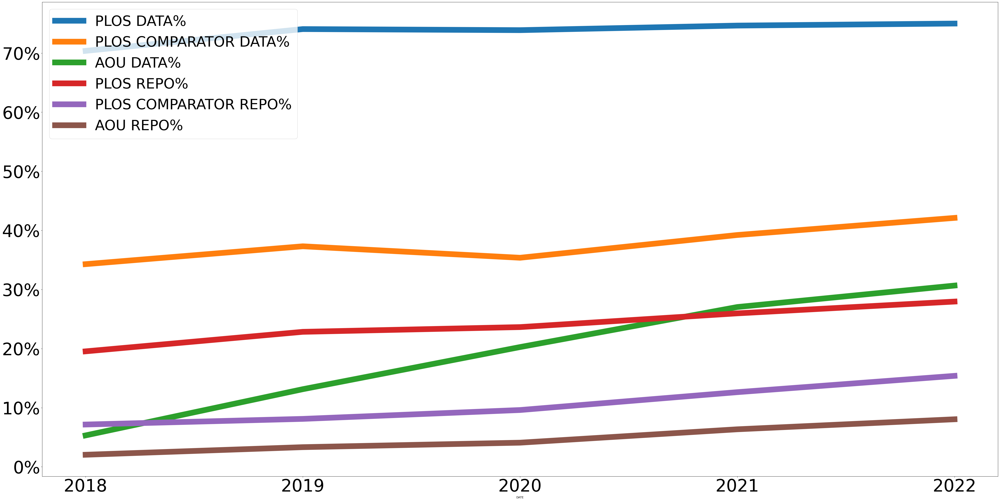

In [55]:
myfileoutfig = myfolder_figures + 'plos_comparison_counts_by_year.png'
# ax = plos_compare[['PLOS REPO%', 'PLOS COMPARATOR REPO%', 'DATA_AOU%', 'DATA_PUBMED%']].plot(linewidth = '20', fontsize=50, figsize=(100,50), legend=True)
ax = plos_compare[['PLOS DATA%', 'PLOS COMPARATOR DATA%', 'AOU DATA%', 'PLOS REPO%', 'PLOS COMPARATOR REPO%', 'AOU REPO%']].plot(linewidth = '20', fontsize=60, figsize=(60,30), legend=True)
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax.xaxis.set_major_locator(mtick.MultipleLocator(1))
ax = ax.legend(loc=2, prop={'size': 50})
fig = ax.get_figure()
fig.set_size_inches(60, 30)
fig.savefig(myfileoutfig, dpi=50)

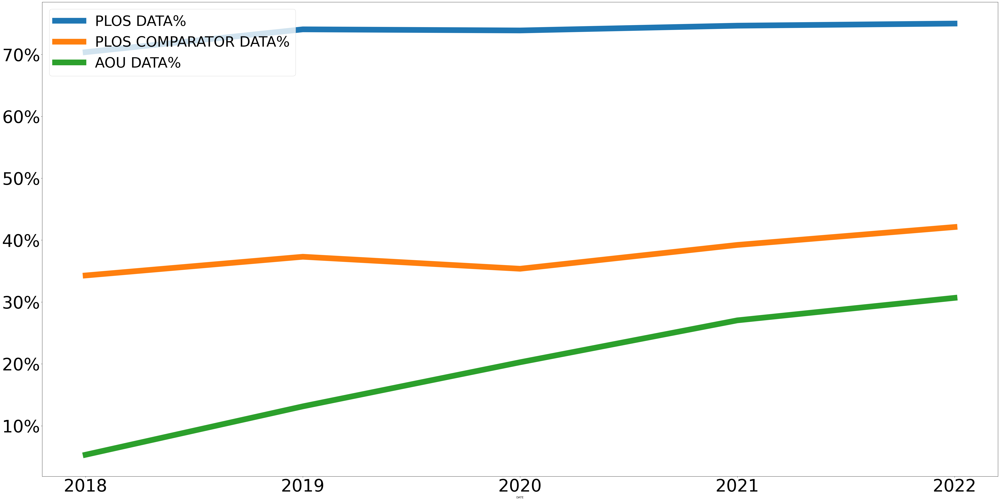

In [56]:
myfileoutfig = myfolder_figures + 'plos_comparison_data_counts_by_year.png'
# ax = plos_compare[['PLOS REPO%', 'PLOS COMPARATOR REPO%', 'DATA_AOU%', 'DATA_PUBMED%']].plot(linewidth = '20', fontsize=50, figsize=(100,50), legend=True)
ax = plos_compare[['PLOS DATA%', 'PLOS COMPARATOR DATA%', 'AOU DATA%']].plot(linewidth = '20', fontsize=60, figsize=(60,30), legend=True)
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax.xaxis.set_major_locator(mtick.MultipleLocator(1))
ax = ax.legend(loc=2, prop={'size': 50})
fig = ax.get_figure()
fig.set_size_inches(60, 30)
fig.savefig(myfileoutfig, dpi=50)

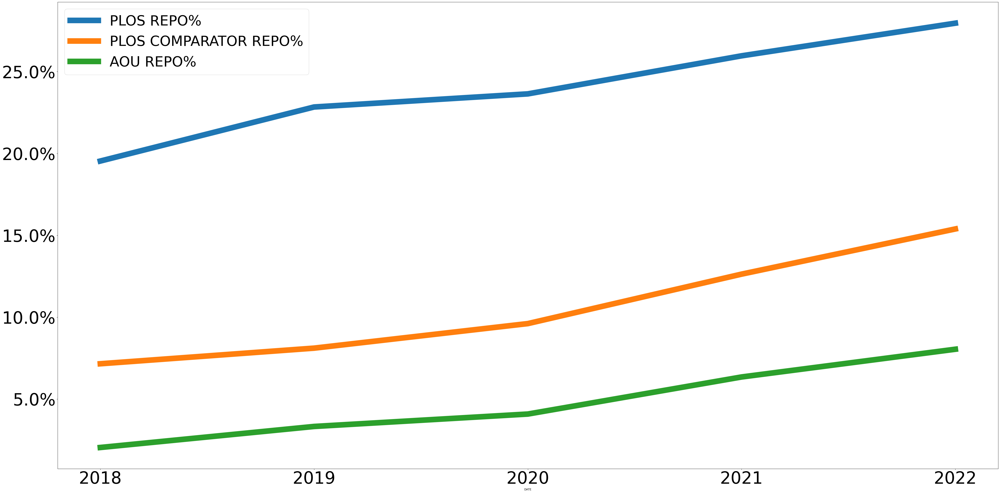

In [57]:
myfileoutfig = myfolder_figures + 'plos_comparison_repo_counts_by_year.png'
# ax = plos_compare[['PLOS REPO%', 'PLOS COMPARATOR REPO%', 'DATA_AOU%', 'DATA_PUBMED%']].plot(linewidth = '20', fontsize=50, figsize=(100,50), legend=True)
ax = plos_compare[['PLOS REPO%', 'PLOS COMPARATOR REPO%', 'AOU REPO%']].plot(linewidth = '20', fontsize=60, figsize=(60,30), legend=True)
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax.xaxis.set_major_locator(mtick.MultipleLocator(1))
ax = ax.legend(loc=2, prop={'size': 50})
fig = ax.get_figure()
fig.set_size_inches(60, 30)
fig.savefig(myfileoutfig, dpi=50)

## Q1E - Observe data sharing trends in publications by authors affiliated with our institution: is there any noticeable variation between clinical, basic or dental medicine disciplines?

Done by FM with Excel (radar graph)


## Q2A - Identify publications that are missing in our repository, and seek common patterns amongst them: is there any reason or logical explanation for their absence?

In [58]:
# venn diagram with the whole picture
set1 = df.loc[(df['AOU'] == 1) & (df['PUBMED'] == 0) & (df['OPENALEX'] == 0)].shape[0]
set2 = df.loc[(df['AOU'] == 0) & (df['PUBMED'] == 1) & (df['OPENALEX'] == 0)].shape[0]
set3 = df.loc[(df['AOU'] == 1) & (df['PUBMED'] == 1) & (df['OPENALEX'] == 0)].shape[0]
set4 = df.loc[(df['AOU'] == 0) & (df['PUBMED'] == 0) & (df['OPENALEX'] == 1)].shape[0]
set5 = df.loc[(df['AOU'] == 1) & (df['PUBMED'] == 0) & (df['OPENALEX'] == 1)].shape[0]
set6 = df.loc[(df['AOU'] == 0) & (df['PUBMED'] == 1) & (df['OPENALEX'] == 1)].shape[0]
set7 = df.loc[(df['AOU'] == 1) & (df['PUBMED'] == 1) & (df['OPENALEX'] == 1)].shape[0]

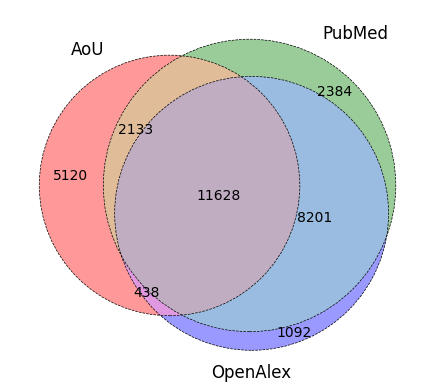

In [59]:
myfileoutfig = myfolder_figures + 'aou_pubmed_openalex_counts_venn.png'
plt1 = venn3(subsets = (set1, set2, set3, set4, set5, set6, set7), set_labels = ('AoU', 'PubMed', 'OpenAlex'))
plt2 = venn3_circles(subsets = (set1, set2, set3, set4, set5, set6, set7), linestyle='dashed', linewidth=0.5)
mpl.pyplot.savefig(myfileoutfig, dpi=200)

In [60]:
# AoU and PubMed
set1 = df.loc[(df['AOU'] == 1) & (df['PUBMED'] == 0)].shape[0]
set2 = df.loc[(df['AOU'] == 0) & (df['PUBMED'] == 1)].shape[0]
set3 = df.loc[(df['AOU'] == 1) & (df['PUBMED'] == 1)].shape[0]

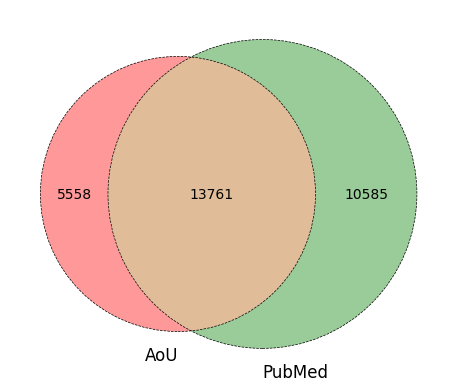

In [61]:
myfileoutfig = myfolder_figures + 'aou_pubmed_counts_venn.png'
plt1 = venn2(subsets = (set1, set2, set3), set_labels = ('AoU', 'PubMed'))
plt2 = venn2_circles(subsets = (set1, set2, set3), linestyle='dashed', linewidth=0.5)
mpl.pyplot.savefig(myfileoutfig, dpi=200)

In [62]:
# AoU with DATA and PubMed
df_aou_pubmed = df.loc[(df['AOU'] == 1) | (df['PUBMED'] == 1)]
print('AoU with DATA:' + str(df_aou_pubmed.loc[(df_aou_pubmed['DATA_AOU'] == 1)].shape[0]))
set1 = df_aou_pubmed.loc[(df_aou_pubmed['DATA_AOU'] == 1) & (df_aou_pubmed['PUBMED'] == 0)].shape[0]
set2 = df_aou_pubmed.loc[(df_aou_pubmed['DATA_AOU'] == 0) & (df_aou_pubmed['PUBMED'] == 1)].shape[0]
set3 = df_aou_pubmed.loc[(df_aou_pubmed['DATA_AOU'] == 1) & (df_aou_pubmed['PUBMED'] == 1)].shape[0]

AoU with DATA:2459


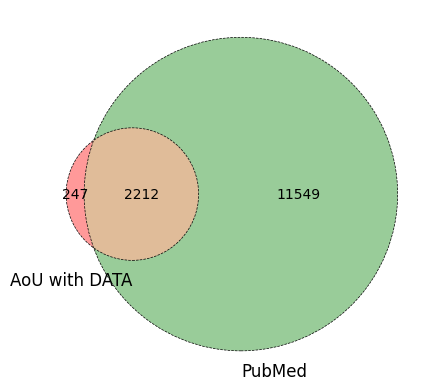

In [63]:
myfileoutfig = myfolder_figures + 'aou_with_data_and_pubmed_counts_venn.png'
plt1 = venn2(subsets = (set1, set2, set3), set_labels = ('AoU with DATA', 'PubMed'))
plt2 = venn2_circles(subsets = (set1, set2, set3), linestyle='dashed', linewidth=0.5)
mpl.pyplot.savefig(myfileoutfig, dpi=200)

In [64]:
# AoU without DATA and PubMed 
print('AoU without DATA:' + str(df_aou_pubmed.loc[(df_aou_pubmed['AOU'] == 1) & (df_aou_pubmed['DATA_AOU'] == 0)].shape[0]))
set1 = df_aou_pubmed.loc[(df_aou_pubmed['AOU'] == 1) & (df_aou_pubmed['DATA_AOU'] == 0) & (df_aou_pubmed['PUBMED'] == 0)].shape[0]
set2 = df_aou_pubmed.loc[(df_aou_pubmed['DATA_AOU'] == 1) & (df_aou_pubmed['PUBMED'] == 1)].shape[0]
set3 = df_aou_pubmed.loc[(df_aou_pubmed['AOU'] == 1) & (df_aou_pubmed['DATA_AOU'] == 0) & (df_aou_pubmed['PUBMED'] == 1)].shape[0]

AoU without DATA:16860


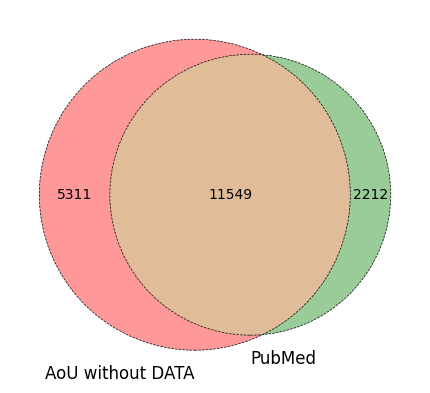

In [65]:
myfileoutfig = myfolder_figures + 'aou_without_data_and_pubmed_counts_venn.png'
plt1 = venn2(subsets = (set1, set2, set3), set_labels = ('AoU without DATA', 'PubMed'))
plt2 = venn2_circles(subsets = (set1, set2, set3), linestyle='dashed', linewidth=0.5)
mpl.pyplot.savefig(myfileoutfig, dpi=200)

In [66]:
df.columns

Index(['ID_AOU', 'DATE_AOU', 'BIOMED_AOU', 'DISCIPLINE_CLINICAL_AOU',
       'DISCIPLINE_BASIC_AOU', 'DISCIPLINE_BIOLOGY_AOU',
       'DISCIPLINE_PHARMA_AOU', 'DISCIPLINE_AFFECTIVE_AOU',
       'DISCIPLINE_DENTISTRY_AOU', 'DISCIPLINE_MEDICINE_GENERAL_AOU',
       'DISCIPLINE_NEUROSCIENCES_AOU', 'DATA_AOU', 'DATA_TYPE_APPENDIXES_AOU',
       'DATA_TYPE_DATA_SUPPLEMENTS_AOU', 'DATA_TYPE_SHARED_DATA_AOU',
       'FUNDER_AOU', 'FNS_FUNDER_AOU', 'EU_FUNDER_AOU', 'DOC_TYPE_AOU', 'DOI',
       'PMID', 'AOU', 'PUBMED', 'DATA_PUBMED', 'OPENALEX', 'ID_OPENALEX',
       'IS_OA_OPENALEX', 'OA_STATUS_OPENALEX', 'DATE_OPENALEX', 'DATE_PUBMED',
       'DATE'],
      dtype='object')

In [67]:
# PubMed AND AoU
pubmed_and_aou = df.loc[(df['PUBMED'] == 1) & (df['AOU'] == 1)][['DATE', 'PUBMED', 'DATA_PUBMED']]
pubmed_and_aou_counts = pubmed_and_aou.groupby(by='DATE').sum()
pubmed_and_aou_counts['NOT DATA'] = pubmed_and_aou_counts['PUBMED'] - pubmed_and_aou_counts['DATA_PUBMED']
pubmed_and_aou_counts = pubmed_and_aou_counts[['DATA_PUBMED', 'NOT DATA']].rename(columns={'DATA_PUBMED' : 'DATA'})
pubmed_and_aou_counts

,DATA,NOT DATA
DATE,,
2015.0,575.0,743.0
2016.0,1293.0,181.0
2017.0,1607.0,118.0
2018.0,1309.0,378.0
2019.0,156.0,1627.0
2020.0,150.0,1824.0
2021.0,856.0,1253.0
2022.0,87.0,1604.0


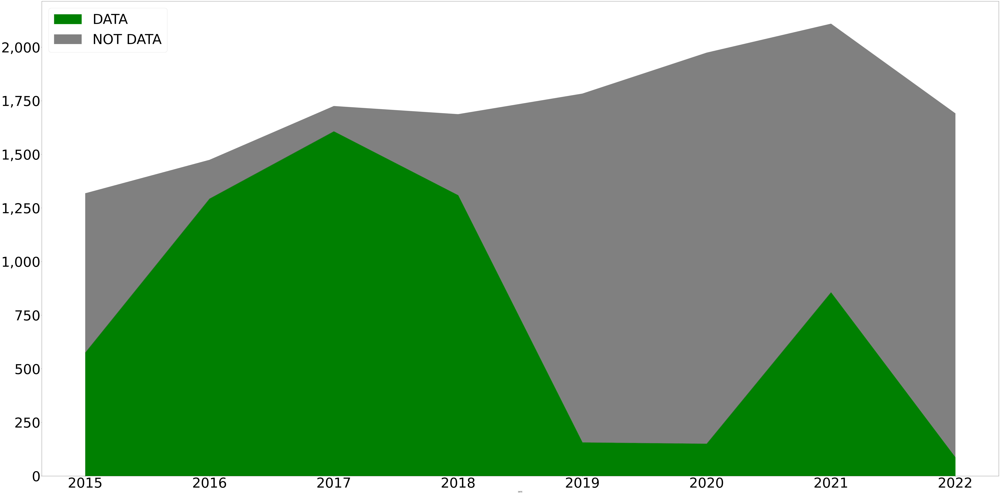

In [68]:
# PubMed AND AoU
myfileoutfig = myfolder_figures + 'pubmed_and_aou_data_counts_by_year.png'
ax = pubmed_and_aou_counts.plot.area(fontsize=80, figsize=(100,50), color=('green', 'gray'), legend=True)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

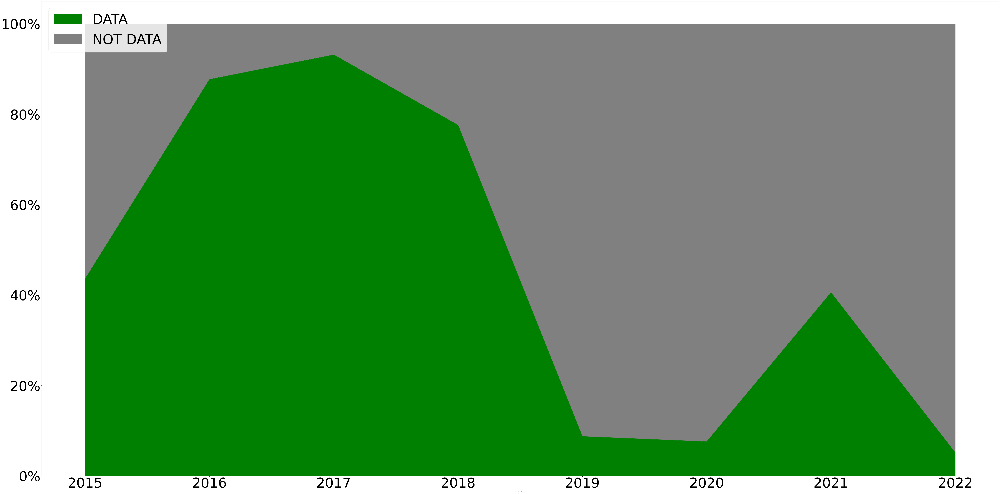

In [69]:
# convert data to percentage (fraction)
pubmed_and_aou_counts_percent = pubmed_and_aou_counts.divide(pubmed_and_aou_counts.sum(axis=1), axis=0)
myfileoutfig = myfolder_figures + 'pubmed_and_aou_data_counts_by_year_percent.png'
ax = pubmed_and_aou_counts_percent.plot.area(fontsize=80, figsize=(100,50), legend=True, color=['green', 'gray'])
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

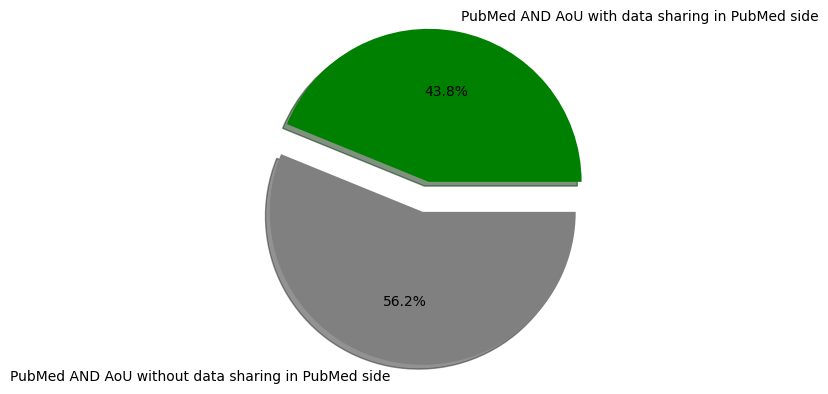

In [70]:
# pie chart
myfileoutfig = myfolder_figures + 'pubmed_and_aou_data_pie_chart.png'
labels = 'PubMed AND AoU with data sharing in PubMed side', 'PubMed AND AoU without data sharing in PubMed side'
sizes = [pubmed_and_aou_counts['DATA'].sum(), pubmed_and_aou_counts['NOT DATA'].sum()]
explode = (0.1, 0.1)
colors = ['green', 'gray']
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=0, colors=colors)
ax1.axis('equal')
fig1.savefig(myfileoutfig, dpi=100)
plt.show()

In [71]:
# PubMed NOT AoU
pubmed_not_aou = df.loc[(df['PUBMED'] == 1) & (df['AOU'] == 0) & (df['DATE'] >= 2015) & (df['DATE'] <= 2022)][['DATE', 'PUBMED', 'DATA_PUBMED']]
pubmed_not_aou_counts = pubmed_not_aou.groupby(by='DATE').sum()
pubmed_not_aou_counts['NOT DATA'] = pubmed_not_aou_counts['PUBMED'] - pubmed_not_aou_counts['DATA_PUBMED']
pubmed_not_aou_counts = pubmed_not_aou_counts[['DATA_PUBMED', 'NOT DATA']].rename(columns={'DATA_PUBMED' : 'DATA'})
pubmed_not_aou_counts

,DATA,NOT DATA
DATE,,
2015.0,335.0,492.0
2016.0,819.0,144.0
2017.0,886.0,123.0
2018.0,860.0,317.0
2019.0,115.0,1025.0
2020.0,54.0,1440.0
2021.0,669.0,1023.0
2022.0,98.0,1831.0


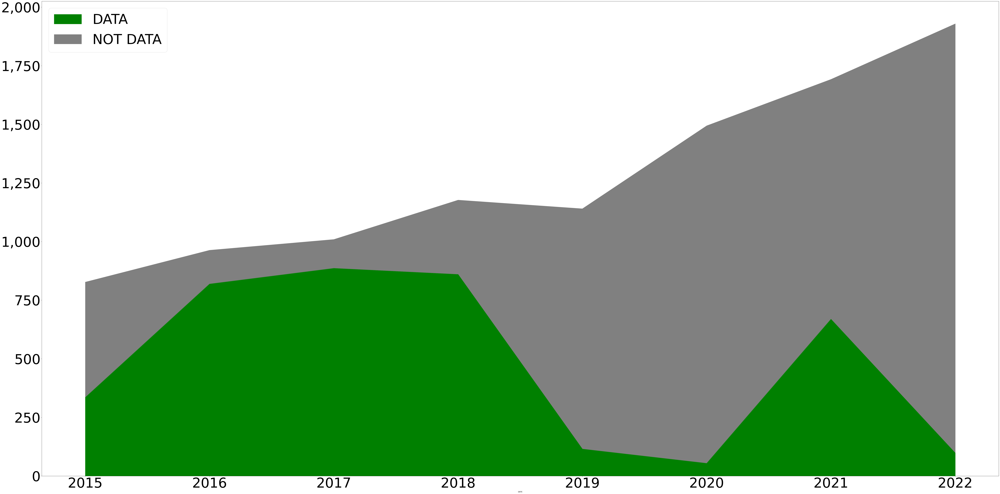

In [72]:
# PubMed NOT AoU
myfileoutfig = myfolder_figures + 'pubmed_not_aou_data_counts_by_year.png'
ax = pubmed_not_aou_counts.plot.area(fontsize=80, figsize=(100,50), color=('green', 'gray'), legend=True)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

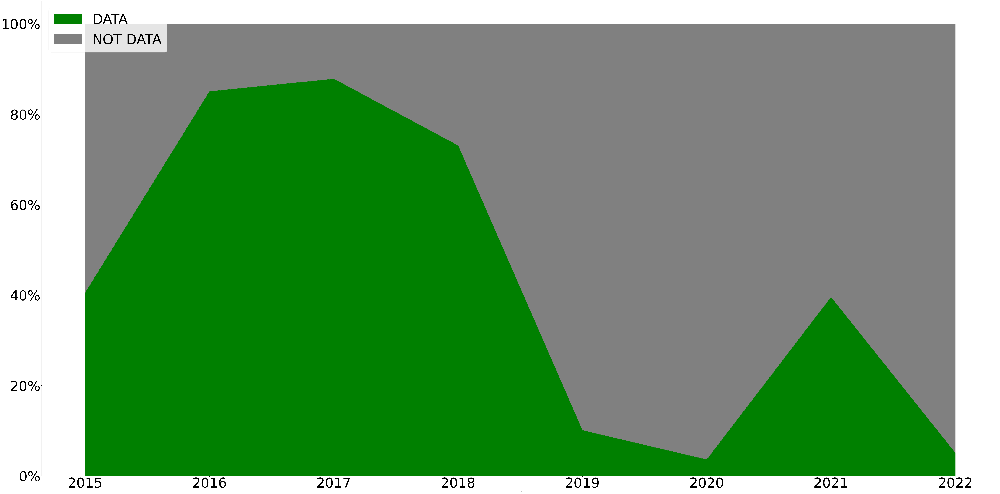

In [73]:
# convert data to percentage (fraction)
pubmed_not_aou_counts_percent = pubmed_not_aou_counts.divide(pubmed_not_aou_counts.sum(axis=1), axis=0)
myfileoutfig = myfolder_figures + 'pubmed_not_aou_data_counts_by_year_percent.png'
ax = pubmed_not_aou_counts_percent.plot.area(fontsize=80, figsize=(100,50), legend=True, color=['green', 'gray'])
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

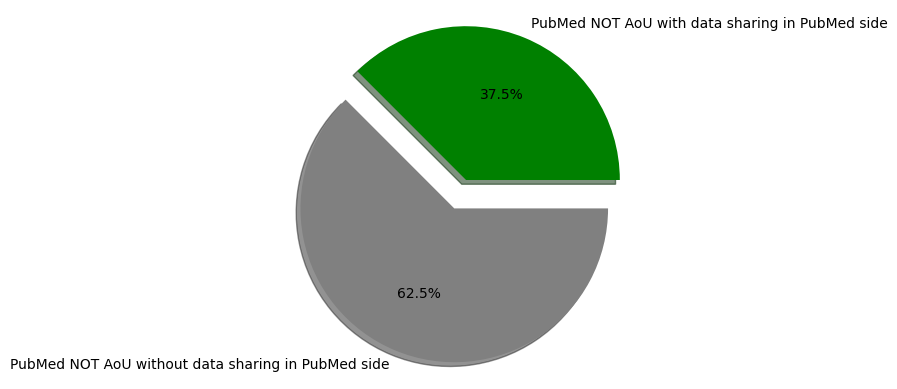

In [74]:
# pie chart
myfileoutfig = myfolder_figures + 'pubmed_not_aou_data_pie_chart.png'
labels = 'PubMed NOT AoU with data sharing in PubMed side', 'PubMed NOT AoU without data sharing in PubMed side'
sizes = [pubmed_not_aou_counts['DATA'].sum(), pubmed_not_aou_counts['NOT DATA'].sum()]
explode = (0.1, 0.1)
colors = ['green', 'gray']
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=0, colors=colors)
ax1.axis('equal')
fig1.savefig(myfileoutfig, dpi=100)
plt.show()

In [75]:
# exports
# csv
pubmed_and_aou_counts.to_csv(myfolder_results + 'pubmed_and_aou_data_counts_by_year.tsv', sep='\t', index=True)
pubmed_not_aou_counts.to_csv(myfolder_results + 'pubmed_not_aou_data_counts_by_year.tsv', sep='\t', index=True)
# excel
pubmed_and_aou_counts.to_excel(myfolder_results + 'pubmed_and_aou_data_counts_by_year.xlsx', index=True)
pubmed_not_aou_counts.to_excel(myfolder_results + 'pubmed_not_aou_data_counts_by_year.xlsx', index=True)

## Q2B - Identify publications that are missing in our repository, and seek common patterns amongst them: Are they not deposited in the repository because they cannot be made Open Access?

TODO: check the OA possibilitites of journals in PubMed NOT AoU

## Q2C - Identify publications that are missing in our repository, and seek common patterns amongst them: Or on the opposite, because, being OA, authors do not feel the need to deposit them?

In [76]:
df['IS_OA_OPENALEX'].value_counts()

IS_OA_OPENALEX
True     15833
False     5088
1.0        285
0.0        153
Name: count, dtype: int64

In [77]:
df.loc[df['IS_OA_OPENALEX'] == 'True']

,ID_AOU,DATE_AOU,BIOMED_AOU,DISCIPLINE_CLINICAL_AOU,DISCIPLINE_BASIC_AOU,DISCIPLINE_BIOLOGY_AOU,DISCIPLINE_PHARMA_AOU,DISCIPLINE_AFFECTIVE_AOU,DISCIPLINE_DENTISTRY_AOU,DISCIPLINE_MEDICINE_GENERAL_AOU,DISCIPLINE_NEUROSCIENCES_AOU,DATA_AOU,DATA_TYPE_APPENDIXES_AOU,DATA_TYPE_DATA_SUPPLEMENTS_AOU,DATA_TYPE_SHARED_DATA_AOU,FUNDER_AOU,FNS_FUNDER_AOU,EU_FUNDER_AOU,DOC_TYPE_AOU,DOI,PMID,AOU,PUBMED,DATA_PUBMED,OPENALEX,ID_OPENALEX,IS_OA_OPENALEX,OA_STATUS_OPENALEX,DATE_OPENALEX,DATE_PUBMED,DATE
10078,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25023584,0,1,0.0,1,W2066786861,True,bronze,2015.0,2015.0,2015.0
10079,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25058504,0,1,0.0,1,W1687620054,True,bronze,2015.0,2015.0,2015.0
10081,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25131892,0,1,0.0,1,W2016429238,True,hybrid,2015.0,2015.0,2015.0
10084,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25232846,0,1,1.0,1,W2027737910,True,bronze,2015.0,2015.0,2015.0
10087,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25296185,0,1,1.0,1,W2038140500,True,green,2015.0,2015.0,2015.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30978,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.1016/J.BULCAN.2021.05.002,34215432,0,0,NaN,1,W3198232470,True,hybrid,2021.0,NaN,2021.0
30979,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.2533/CHIMIA.2021.675,34523407,0,0,NaN,1,W3201602738,True,gold,2021.0,NaN,2021.0
30980,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.1016/J.IJROBP.2021.07.874,34701053,0,0,NaN,1,W3209278600,True,bronze,2021.0,NaN,2021.0
30981,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.1186/S13046-021-02132-0,34686193,0,0,NaN,1,W4205945688,True,gold,2021.0,NaN,2021.0


In [78]:
df.loc[df['IS_OA_OPENALEX'] == '1.0']

,ID_AOU,DATE_AOU,BIOMED_AOU,DISCIPLINE_CLINICAL_AOU,DISCIPLINE_BASIC_AOU,DISCIPLINE_BIOLOGY_AOU,DISCIPLINE_PHARMA_AOU,DISCIPLINE_AFFECTIVE_AOU,DISCIPLINE_DENTISTRY_AOU,DISCIPLINE_MEDICINE_GENERAL_AOU,DISCIPLINE_NEUROSCIENCES_AOU,DATA_AOU,DATA_TYPE_APPENDIXES_AOU,DATA_TYPE_DATA_SUPPLEMENTS_AOU,DATA_TYPE_SHARED_DATA_AOU,FUNDER_AOU,FNS_FUNDER_AOU,EU_FUNDER_AOU,DOC_TYPE_AOU,DOI,PMID,AOU,PUBMED,DATA_PUBMED,OPENALEX,ID_OPENALEX,IS_OA_OPENALEX,OA_STATUS_OPENALEX,DATE_OPENALEX,DATE_PUBMED,DATE
9639,unige:54992,2015.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Article scientifique,10.1016/J.JHEP.2014.09.018,25245893,1,0,0.0,1,W1989074294,1.0,hybrid,2015.0,NaN,2015.0
9641,unige:98743,2015.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,Article scientifique,10.1016/J.NEUROSCIENCE.2014.09.059,25316409,1,0,0.0,1,W2073673228,1.0,hybrid,2015.0,NaN,2015.0
9642,unige:76344,2015.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Article scientifique,10.1515/JPEM-2014-0321,25332294,1,0,0.0,1,W2152999813,1.0,green,2015.0,NaN,2015.0
9643,unige:88214,2015.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Article scientifique,10.1160/TH14-05-0466,25374339,1,0,0.0,1,W1995551387,1.0,green,2015.0,NaN,2015.0
9644,unige:73903,2015.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Article scientifique,10.1111/JTH.12793,25403550,1,0,0.0,1,W2119730233,1.0,hybrid,2015.0,NaN,2015.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10070,unige:166651,2022.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,Article scientifique,10.1177/15910199221145745,36529940,1,0,0.0,1,W4311933681,1.0,hybrid,2022.0,NaN,2022.0
10071,unige:173715,2022.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,Article scientifique,10.1530/REP-22-0312,36538648,1,0,0.0,1,W4312066132,1.0,bronze,2022.0,NaN,2022.0
10072,unige:166004,2022.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Article scientifique,10.1093/INFDIS/JIAC487,36542509,1,0,0.0,1,W4312065292,1.0,bronze,2022.0,NaN,2022.0
10073,unige:166812,2022.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,Article scientifique,10.1093/STCLTM/SZAC081,36571216,1,0,0.0,1,W4312194965,1.0,gold,2022.0,NaN,2022.0


In [79]:
df.loc[df['IS_OA_OPENALEX'] == '1.0', 'OA'] = 1
df.loc[df['IS_OA_OPENALEX'] == '0.0', 'OA'] = 0
df.loc[df['IS_OA_OPENALEX'] == 'True', 'OA'] = 1
df.loc[df['IS_OA_OPENALEX'] == 'False', 'OA'] = 0
df['OA'] = df['OA'].fillna(0)
df['OA'] = df['OA'].astype(int)
df['OA'].value_counts()

OA
1    16118
0    14878
Name: count, dtype: int64

In [80]:
# AoU AND PubMed: OA
pubmed_aou_oa = df.loc[(df['AOU'] == 1) & (df['OPENALEX'] == 1) & (df['DATE'] >= 2015) & (df['DATE'] <= 2022)][['DATE', 'AOU', 'PUBMED', 'OA']]
pubmed_aou_oa_counts = pubmed_aou_oa.groupby(by=['DATE', 'PUBMED']).sum()
pubmed_aou_oa_counts['NOT OA'] = pubmed_aou_oa_counts['AOU'] - pubmed_aou_oa_counts['OA']
pubmed_aou_oa_counts = pubmed_aou_oa_counts[['OA', 'NOT OA']]
pubmed_aou_oa_counts = pubmed_aou_oa_counts.reset_index()
pubmed_aou_oa_counts = pubmed_aou_oa_counts.set_index('DATE')
# pubmed_aou_oa_counts = pubmed_aou_oa_counts.rename(columns={'DATA_PUBMED' : 'DATA'})
pubmed_aou_oa_counts

,PUBMED,OA,NOT OA
DATE,,,
2015.0,0,61,44
2015.0,1,727,314
2016.0,0,43,32
2016.0,1,820,434
2017.0,0,31,20
2017.0,1,1019,436
2018.0,0,35,27
2018.0,1,1038,363
2019.0,0,27,10


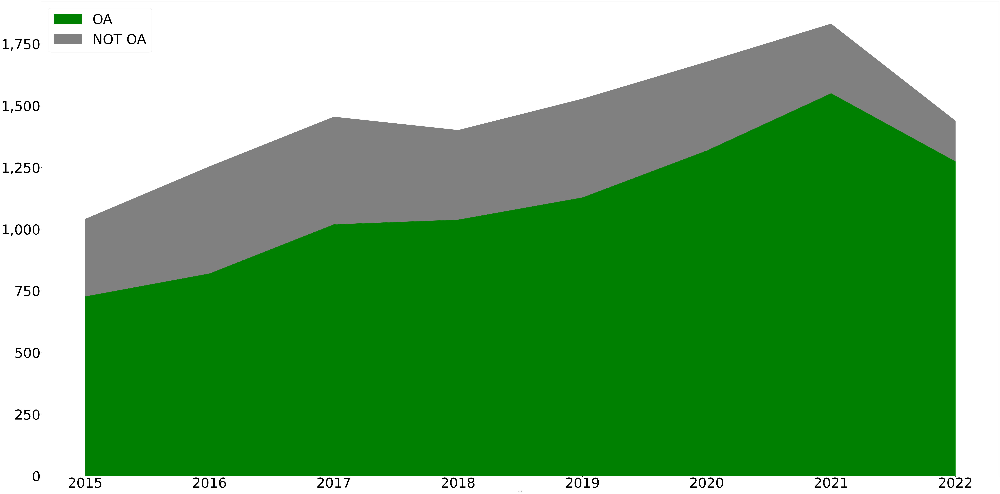

In [81]:
# AoU AND PubMed: OA
myfileoutfig = myfolder_figures + 'aou_and_pubmed_oa_counts_by_year.png'
ax = pubmed_aou_oa_counts.loc[pubmed_aou_oa_counts['PUBMED'] == 1][['OA', 'NOT OA']].plot.area(fontsize=80, figsize=(100,50), color=('green', 'gray'), legend=True)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

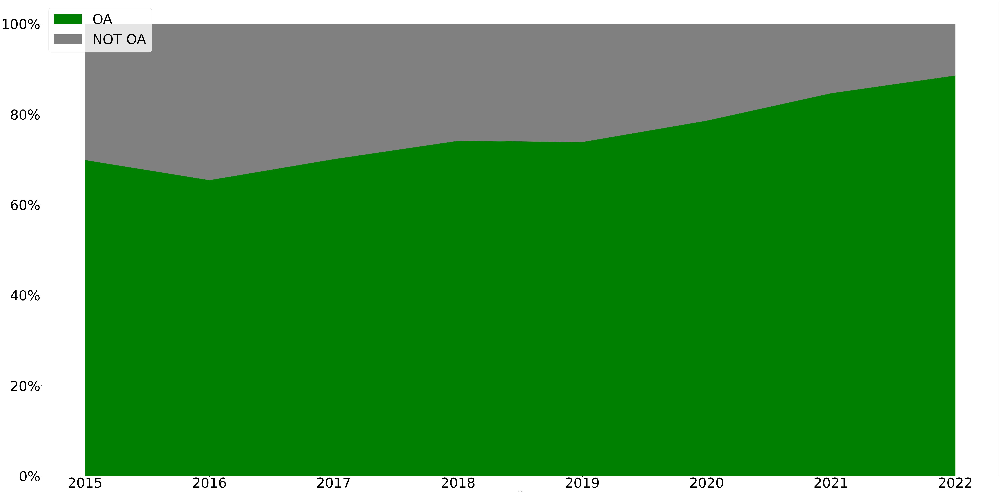

In [82]:
# AoU AND PubMed: OA
pubmed_aou_oa_counts_percent = pubmed_aou_oa_counts.loc[pubmed_aou_oa_counts['PUBMED'] == 1][['OA', 'NOT OA']].divide(pubmed_aou_oa_counts.loc[pubmed_aou_oa_counts['PUBMED'] == 1][['OA', 'NOT OA']].sum(axis=1), axis=0)
myfileoutfig = myfolder_figures + 'aou_and_pubmed_oa_counts_by_year_percent.png'
ax = pubmed_aou_oa_counts_percent.plot.area(fontsize=80, figsize=(100,50), legend=True, color=['green', 'gray'])
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

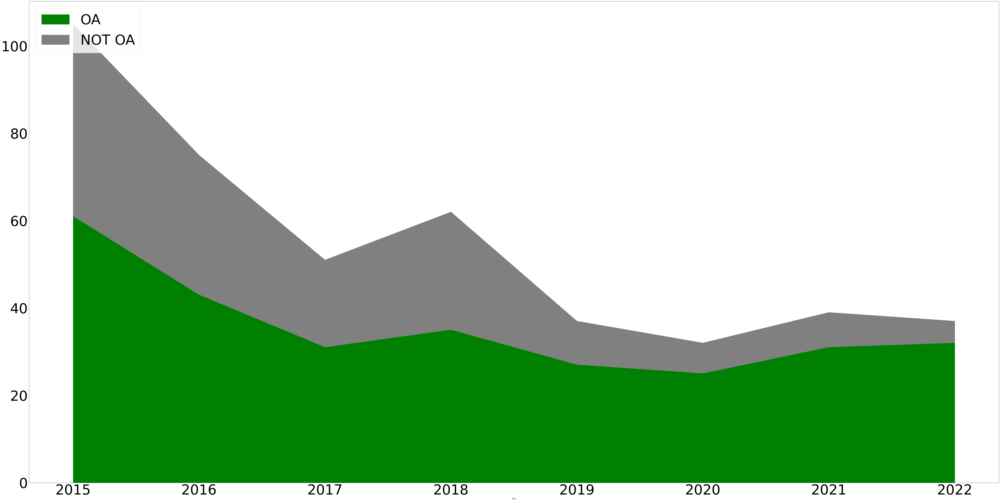

In [83]:
# AoU NOT PubMed: OA
myfileoutfig = myfolder_figures + 'aou_not_pubmed_oa_counts_by_year.png'
ax = pubmed_aou_oa_counts.loc[pubmed_aou_oa_counts['PUBMED'] == 0][['OA', 'NOT OA']].plot.area(fontsize=80, figsize=(100,50), color=('green', 'gray'), legend=True)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

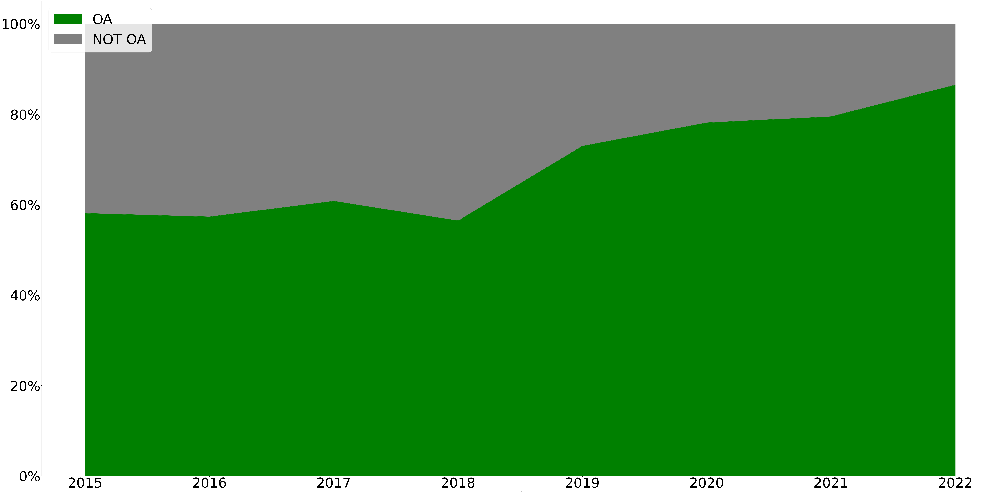

In [84]:
# AoU NOT PubMed: OA
pubmed_aou_oa_counts_percent2 = pubmed_aou_oa_counts.loc[pubmed_aou_oa_counts['PUBMED'] == 0][['OA', 'NOT OA']].divide(pubmed_aou_oa_counts.loc[pubmed_aou_oa_counts['PUBMED'] == 0][['OA', 'NOT OA']].sum(axis=1), axis=0)
myfileoutfig = myfolder_figures + 'aou_not_pubmed_oa_counts_by_year_percent.png'
ax = pubmed_aou_oa_counts_percent2.plot.area(fontsize=80, figsize=(100,50), legend=True, color=['green', 'gray'])
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

In [85]:
# PubMed NOT AoU: OA
pubmed_not_aou_oa = df.loc[(df['PUBMED'] == 1) & (df['AOU'] == 0) & (df['OPENALEX'] == 1) & (df['DATE'] >= 2015) & (df['DATE'] <= 2022)][['DATE', 'PUBMED', 'OA']]
pubmed_not_aou_oa_counts = pubmed_not_aou_oa.groupby(by=['DATE']).sum()
pubmed_not_aou_oa_counts['NOT OA'] = pubmed_not_aou_oa_counts['PUBMED'] - pubmed_not_aou_oa_counts['OA']
pubmed_not_aou_oa_counts = pubmed_not_aou_oa_counts[['OA', 'NOT OA']]
pubmed_not_aou_oa_counts

,OA,NOT OA
DATE,,
2015.0,436,227
2016.0,518,248
2017.0,542,239
2018.0,640,278
2019.0,660,232
2020.0,888,263
2021.0,1122,220
2022.0,1243,266


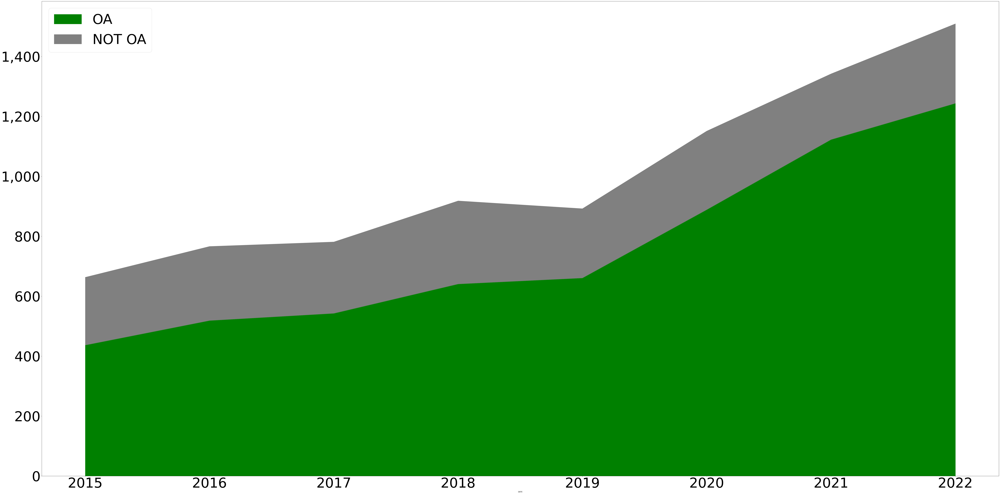

In [86]:
# PubMed NOT AoU: OA
myfileoutfig = myfolder_figures + 'pubmed_not_aou_oa_counts_by_year.png'
ax = pubmed_not_aou_oa_counts.plot.area(fontsize=80, figsize=(100,50), color=('green', 'gray'), legend=True)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

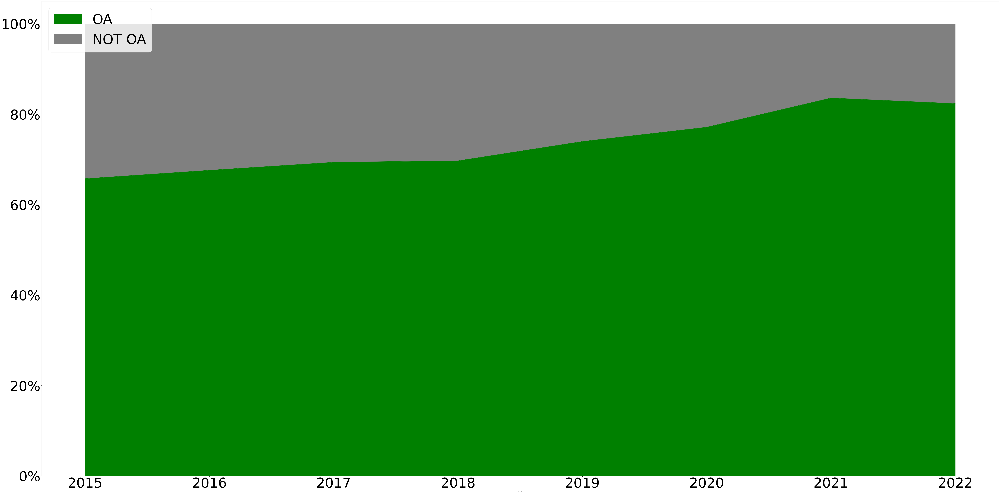

In [87]:
# PubMed NOT AoU: OA
pubmed_not_aou_oa_counts_percent = pubmed_not_aou_oa_counts.divide(pubmed_not_aou_oa_counts.sum(axis=1), axis=0)
myfileoutfig = myfolder_figures + 'pubmed_not_aou_oa_counts_by_year_percent.png'
ax = pubmed_not_aou_oa_counts_percent.plot.area(fontsize=80, figsize=(100,50), legend=True, color=['green', 'gray'])
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

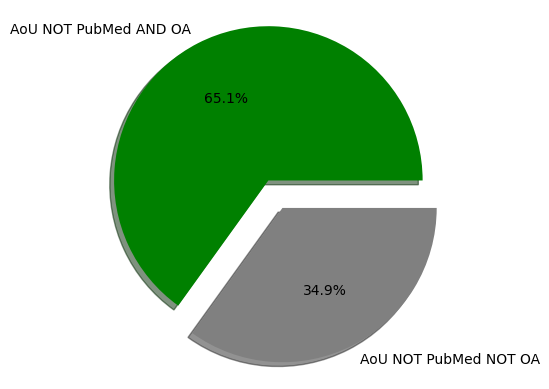

In [88]:
# AoU NOT PubMed: OA pie chart
myfileoutfig = myfolder_figures + 'aou_not_pubmed_oa_pie_chart.png'
labels = 'AoU NOT PubMed AND OA', 'AoU NOT PubMed NOT OA'
sizes = [pubmed_aou_oa_counts.loc[pubmed_aou_oa_counts['PUBMED'] == 0]['OA'].sum(), pubmed_aou_oa_counts.loc[pubmed_aou_oa_counts['PUBMED'] == 0]['NOT OA'].sum()]
explode = (0.1, 0.1)
colors = ['green', 'gray']
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=0, colors=colors)
ax1.axis('equal')
fig1.savefig(myfileoutfig, dpi=100)
plt.show()

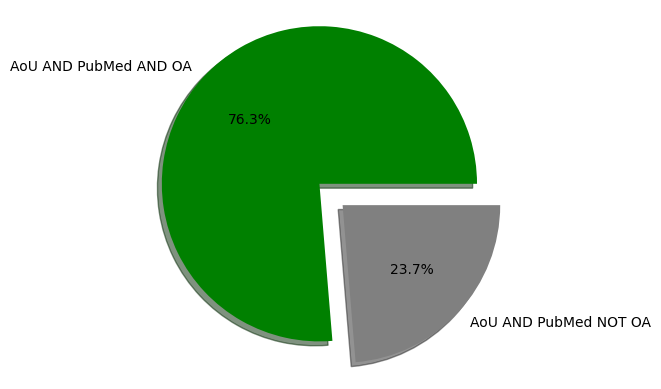

In [89]:
# PubMed AND AoU: OA pie chart
myfileoutfig = myfolder_figures + 'aou_and_pubmed_oa_pie_chart.png'
labels = 'AoU AND PubMed AND OA', 'AoU AND PubMed NOT OA'
sizes = [pubmed_aou_oa_counts.loc[pubmed_aou_oa_counts['PUBMED'] == 1]['OA'].sum(), pubmed_aou_oa_counts.loc[pubmed_aou_oa_counts['PUBMED'] == 1]['NOT OA'].sum()]
explode = (0.1, 0.1)
colors = ['green', 'gray']
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=0, colors=colors)
ax1.axis('equal')
fig1.savefig(myfileoutfig, dpi=100)
plt.show()

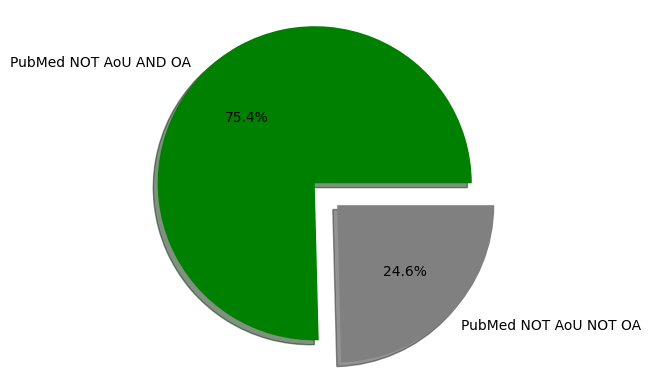

In [90]:
# PubMed NOT AoU: OA pie chart
myfileoutfig = myfolder_figures + 'pubmed_not_aou_oa_pie_chart.png'
labels = 'PubMed NOT AoU AND OA', 'PubMed NOT AoU NOT OA'
sizes = [pubmed_not_aou_oa_counts['OA'].sum(), pubmed_not_aou_oa_counts['NOT OA'].sum()]
explode = (0.1, 0.1)
colors = ['green', 'gray']
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=0, colors=colors)
ax1.axis('equal')
fig1.savefig(myfileoutfig, dpi=100)
plt.show()

In [91]:
# PubMed NOT AoU: DATA and OA
pubmed_not_aou_data_oa = df.loc[(df['PUBMED'] == 1) & (df['AOU'] == 0) & (df['OPENALEX'] == 1) & (df['DATE'] >= 2015) & (df['DATE'] <= 2022)][['DATE', 'PUBMED', 'DATA_PUBMED', 'OA']]
pubmed_not_aou_data_oa_counts = pubmed_not_aou_data_oa.groupby(by=['DATE', 'DATA_PUBMED']).sum()
# pubmed_not_aou_oa_counts['NOT DATA'] = pubmed_not_aou_oa_counts['PUBMED'] - pubmed_not_aou_oa_counts['DATA_PUBMED']
pubmed_not_aou_data_oa_counts['NOT OA'] = pubmed_not_aou_data_oa_counts['PUBMED'] - pubmed_not_aou_data_oa_counts['OA']
pubmed_not_aou_data_oa_counts = pubmed_not_aou_data_oa_counts[['OA', 'NOT OA']]
pubmed_not_aou_data_oa_counts = pubmed_not_aou_data_oa_counts.reset_index()
pubmed_not_aou_data_oa_counts = pubmed_not_aou_data_oa_counts.set_index('DATE')
pubmed_not_aou_data_oa_counts = pubmed_not_aou_data_oa_counts.rename(columns={'DATA_PUBMED' : 'DATA'})
pubmed_not_aou_data_oa_counts

,DATA,OA,NOT OA
DATE,,,
2015.0,0.0,212,220
2015.0,1.0,224,7
2016.0,0.0,43,41
2016.0,1.0,475,207
2017.0,0.0,7,22
2017.0,1.0,535,217
2018.0,0.0,146,29
2018.0,1.0,494,249
2019.0,0.0,604,195


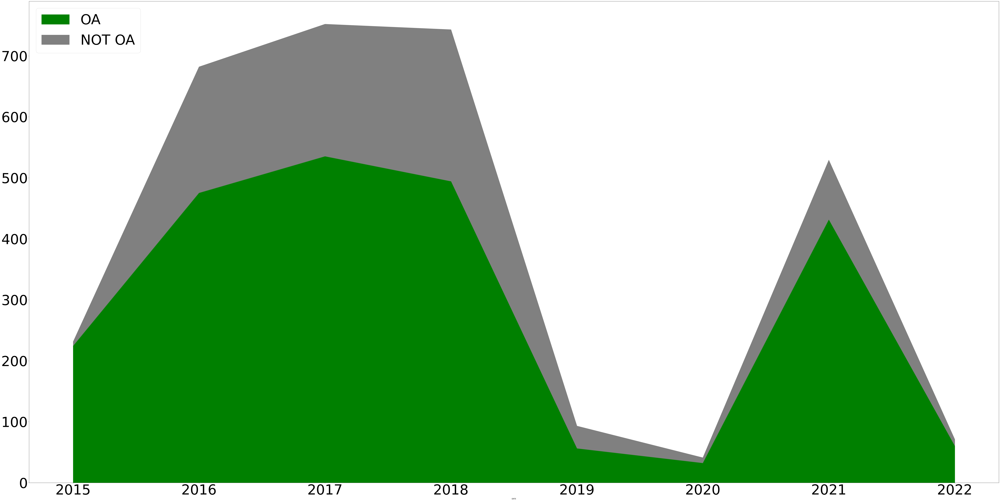

In [92]:
# PubMed NOT AoU: DATA and OA
myfileoutfig = myfolder_figures + 'pubmed_not_aou_and_data_oa_counts_by_year.png'
ax = pubmed_not_aou_data_oa_counts.loc[pubmed_not_aou_data_oa_counts['DATA'] == 1][['OA', 'NOT OA']].plot.area(fontsize=80, figsize=(100,50), color=('green', 'gray'), legend=True)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

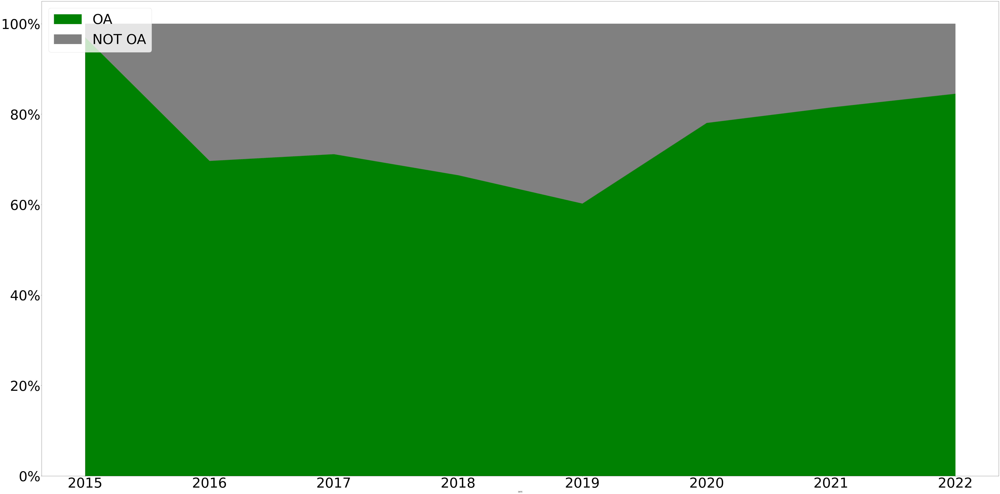

In [93]:
# PubMed NOT AoU: DATA AND OA
pubmed_not_aou_data_oa_counts_percent = pubmed_not_aou_data_oa_counts.loc[pubmed_not_aou_data_oa_counts['DATA'] == 1][['OA', 'NOT OA']].divide(pubmed_not_aou_data_oa_counts.loc[pubmed_not_aou_data_oa_counts['DATA'] == 1][['OA', 'NOT OA']].sum(axis=1), axis=0)
myfileoutfig = myfolder_figures + 'pubmed_not_aou_and_data_oa_counts_by_year_percent.png'
ax = pubmed_not_aou_data_oa_counts_percent.plot.area(fontsize=80, figsize=(100,50), legend=True, color=['green', 'gray'])
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

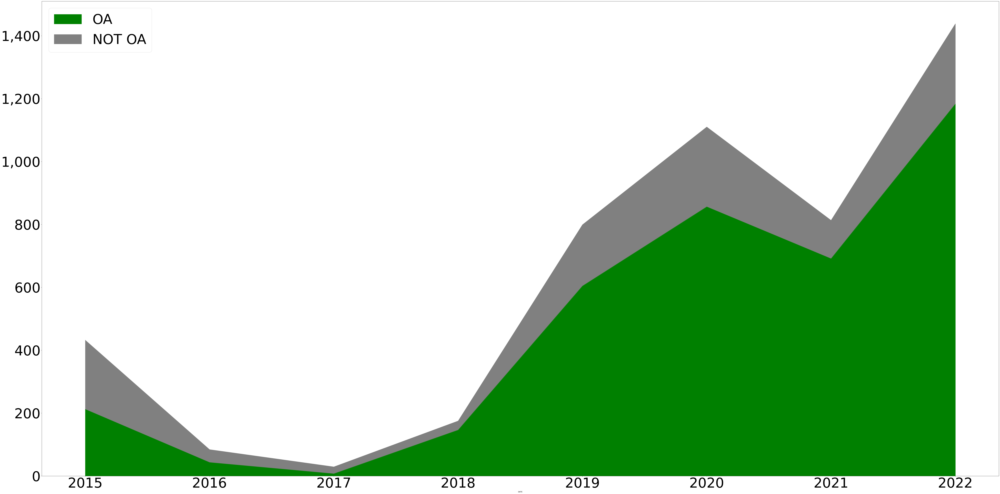

In [94]:
# PubMed NOT AoU: NOT DATA and OA
myfileoutfig = myfolder_figures + 'pubmed_not_aou_not_data_oa_counts_by_year.png'
ax = pubmed_not_aou_data_oa_counts.loc[pubmed_not_aou_data_oa_counts['DATA'] == 0][['OA', 'NOT OA']].plot.area(fontsize=80, figsize=(100,50), color=('green', 'gray'), legend=True)
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

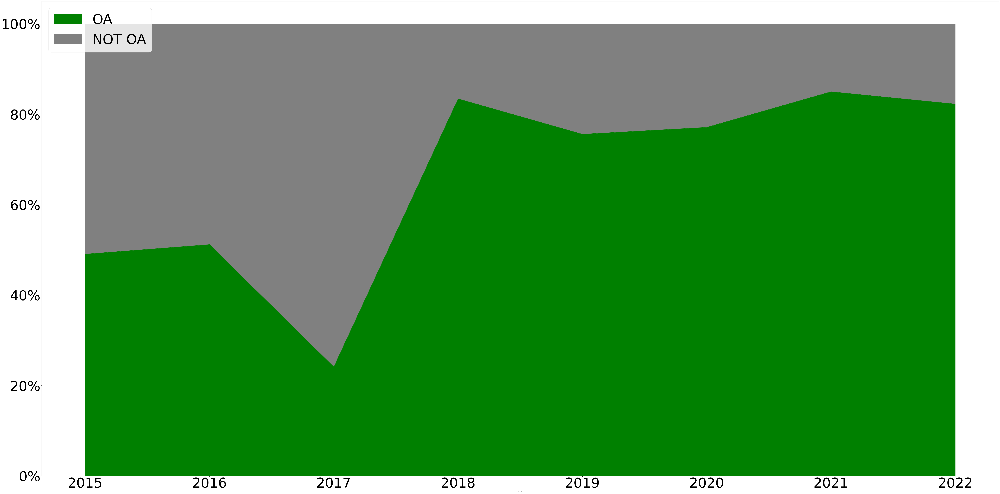

In [95]:
# PubMed NOT AoU: NOT DATA and OA
pubmed_not_aou_data_oa_counts_percent2 = pubmed_not_aou_data_oa_counts.loc[pubmed_not_aou_data_oa_counts['DATA'] == 0][['OA', 'NOT OA']].divide(pubmed_not_aou_data_oa_counts.loc[pubmed_not_aou_data_oa_counts['DATA'] == 0][['OA', 'NOT OA']].sum(axis=1), axis=0)
myfileoutfig = myfolder_figures + 'pubmed_not_aou_not_data_oa_counts_by_year_percent.png'
ax = pubmed_not_aou_data_oa_counts_percent2.plot.area(fontsize=80, figsize=(100,50), legend=True, color=['green', 'gray'])
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax = ax.legend(loc=2, prop={'size': 80})
fig = ax.get_figure()
fig.set_size_inches(100, 50)
fig.savefig(myfileoutfig, dpi=50)

In [96]:
# exports
# csv
pubmed_aou_oa_counts.to_csv(myfolder_results + 'pubmed_and_aou_oa_counts_by_year.tsv', sep='\t', index=True)
pubmed_not_aou_oa_counts.to_csv(myfolder_results + 'pubmed_not_aou_oa_counts_by_year.tsv', sep='\t', index=True)
pubmed_not_aou_data_oa_counts.to_csv(myfolder_results + 'pubmed_not_aou_data_oa_counts_by_year.tsv', sep='\t', index=True)
# excel
pubmed_aou_oa_counts.to_excel(myfolder_results + 'pubmed_and_aou_oa_counts_by_year.xlsx', index=True)
pubmed_not_aou_oa_counts.to_excel(myfolder_results + 'pubmed_not_aou_oa_counts_by_year.xlsx', index=True)
pubmed_not_aou_data_oa_counts.to_excel(myfolder_results + 'pubmed_not_aou_data_oa_counts_by_year.xlsx', index=True)

In [97]:
# correlation PubMed and OA
corr = df.loc[(df['OPENALEX'] == 1) & (df['DATE'] >= 2015) & (df['DATE'] <= 2022)][['AOU', 'DATA_AOU', 'PUBMED', 'DATA_PUBMED', 'OA']].corr()
corr.style.background_gradient(cmap='coolwarm').to_excel(myfolder_results + 'pubmed_data_aou_correlation.xlsx', index=True)
corr.style.background_gradient(cmap='coolwarm')

,AOU,DATA_AOU,PUBMED,DATA_PUBMED,OA
AOU,1.000000,nan,0.159726,0.038315,0.011015
DATA_AOU,nan,1.000000,0.046540,-0.179181,0.152581
PUBMED,0.159726,0.046540,1.000000,0.125703,0.037350
DATA_PUBMED,0.038315,-0.179181,0.125703,1.000000,-0.011699
OA,0.011015,0.152581,0.037350,-0.011699,1.000000


In [98]:
# Doc types in AoU NOT PubMed
df.loc[(df['AOU'] == 1) & (df['PUBMED'] == 0)][['AOU', 'DOC_TYPE_AOU']].groupby(by='DOC_TYPE_AOU').sum()

,AOU
DOC_TYPE_AOU,
Article professionnel,232
Article scientifique,2937
Autre article,36
Chapitre d'actes,106
Chapitre de livre,285
Contribution à un dictionnaire / une encyclopédie,26
Livre,42
Master,433
Master d'études avancées,28


In [99]:
# exports
# csv
df.loc[(df['AOU'] == 1) & (df['PUBMED'] == 0)][['AOU', 'DOC_TYPE_AOU']].groupby(by='DOC_TYPE_AOU').sum().to_csv(myfolder_results + 'aou_not_pubmed_counts_by_doctype.tsv', sep='\t', index=True)
# excel
df.loc[(df['AOU'] == 1) & (df['PUBMED'] == 0)][['AOU', 'DOC_TYPE_AOU']].groupby(by='DOC_TYPE_AOU').sum().to_excel(myfolder_results + 'aou_not_pubmed_counts_by_doctype.xlsx', index=True)


In [106]:
# AoU NOT PubMed: journals
df_773 = pd.read_csv(export_773, delimiter='\t', header=0)
df_773

,id,773t
0,unige:1,International journal of pharmaceutics
1,unige:2,Chemical communications
2,unige:3,European journal of pharmaceutics and biopharmaceutics
3,unige:4,Journal of pharmaceutical sciences
4,unige:5,Pharmaceutical research
...,...,...
89873,unige:167398,Bone reports
89874,unige:167399,Joint bone spine
89875,unige:167400,European journal of endocrinology
89876,unige:167401,International journal of molecular sciences


In [107]:
# AoU NOT PubMed: journals
aou_not_pubmed_773 = df.loc[(df['AOU'] == 1) & (df['PUBMED'] == 0)][['ID_AOU', 'DOC_TYPE_AOU']].merge(df_773, left_on='ID_AOU', right_on='id', how='left')
aou_not_pubmed_773 = aou_not_pubmed_773.loc[aou_not_pubmed_773['773t'].notna()]
aou_not_pubmed_773

,ID_AOU,DOC_TYPE_AOU,id,773t
1,unige:29525,Article scientifique,unige:29525,Psychiatry research
2,unige:35523,Article scientifique,unige:35523,Veterinary ophthalmology
3,unige:74670,Article scientifique,unige:74670,The Cleft palate-craniofacial journal
4,unige:74675,Article scientifique,unige:74675,The Cleft palate-craniofacial journal
5,unige:76219,Article scientifique,unige:76219,Pediatric diabetes
...,...,...,...,...
5553,unige:166651,Article scientifique,unige:166651,Interventional neuroradiology
5554,unige:173715,Article scientifique,unige:173715,Reproduction
5555,unige:166004,Article scientifique,unige:166004,The journal of infectious diseases
5556,unige:166812,Article scientifique,unige:166812,Stem cells translational medicine


In [110]:
# Doc types in AoU NOT PubMed
aou_not_pubmed_773['COUNT'] = 1
aou_not_pubmed_773_count = aou_not_pubmed_773[['COUNT', '773t']].groupby(by='773t').sum()
aou_not_pubmed_773_count

,COUNT
773t,
(In)Scribing Gender,1
12th European Public Health Conference Building bridges for solidarity and public health,1
13 cas cliniques en neuropsychologie des émotions,2
13ème Congrès Francophone d'Allergologie,1
14th European Public Health (EPH) Conference 2021,1
...,...
« Jusqu'au sombre plaisir d'un coeur mélancolique ». Etudes de littérature française du XVIIe siècle offertes à Patrick Dandrey,1
Áltera,1
Éducation thérapeutique du patient,2


In [111]:
# exports
# csv
aou_not_pubmed_773_count.to_csv(myfolder_results + 'aou_not_pubmed_counts_by_773t.tsv', sep='\t', index=True)
# excel
aou_not_pubmed_773_count.to_excel(myfolder_results + 'aou_not_pubmed_counts_by_773t.xlsx', index=True)


In [113]:
# PubMed NOT AoU: journals
pubmed_not_aou_journals = df.loc[(df['AOU'] == 0) & (df['PUBMED'] == 1)][['PUBMED', 'PMID']]
pubmed_not_aou_journals

,PUBMED,PMID
5120,1,24385222
5121,1,24448223
5122,1,24553738
5123,1,24612083
5124,1,24676279
...,...,...
18271,1,38550944
18272,1,38585625
18273,1,38620847
18274,1,38624653


In [115]:
# PubMed NOT AoU: journals
pubmed_journals = pd.read_csv(export_pubmed, delimiter='\t', usecols=['PMID', 'Journal/Book'], header=0)
pubmed_journals

,PMID,Journal/Book
0,25773637,Ann N Y Acad Sci
1,26569380,Nat Med
2,26586182,Neuron
3,28816886,Pain
4,29150871,Mov Disord
...,...,...
24342,34895743,J Hepatol
24343,33685583,Elife
24344,36257718,Neurology
24345,33766997,Neurology


In [116]:
# AoU NOT PubMed: journals
pubmed_not_aou_journals = pubmed_not_aou_journals.merge(pubmed_journals, on='PMID', how='left')
pubmed_not_aou_journals = pubmed_not_aou_journals.loc[pubmed_not_aou_journals['Journal/Book'].notna()]
pubmed_not_aou_journals

,PUBMED,PMID,Journal/Book
0,1,24385222,Curr Top Behav Neurosci
1,1,24448223,J Atten Disord
2,1,24553738,Child Psychiatry Hum Dev
3,1,24612083,J Intellect Disabil Res
4,1,24676279,Health Promot Int
...,...,...,...
10580,1,38550944,Camb Prism Precis Med
10581,1,38585625,Environ Res Lett
10582,1,38620847,Glob Financ J
10583,1,38624653,Z Literaturwissenschaft Linguist


In [117]:
# Doc types in AoU NOT PubMed
pubmed_not_aou_journals['COUNT'] = 1
pubmed_not_aou_journals_counts = pubmed_not_aou_journals[['COUNT', 'Journal/Book']].groupby(by='Journal/Book').sum()
pubmed_not_aou_journals_counts

,COUNT
Journal/Book,
A Life Course Perspective on Health Trajectories and Transitions,11
ACS Appl Bio Mater,1
ACS Appl Energy Mater,2
ACS Appl Mater Interfaces,6
ACS Catal,1
...,...
eNeuro,4
iScience,6
mBio,5


In [118]:
# exports
# csv
pubmed_not_aou_journals_counts.to_csv(myfolder_results + 'pubmed_not_aou_journals_counts.tsv', sep='\t', index=True)
# excel
pubmed_not_aou_journals_counts.to_excel(myfolder_results + 'pubmed_not_aou_journals_counts.xlsx', index=True)

In [120]:
# PMIDs in AoU non BIOMED
aou_pmids = pd.read_csv(export_aou_pmids, delimiter='\t', header=0)
aou_pmids

,id,pmid
0,unige:1,17997238
1,unige:2,18092080
2,unige:3,17884402
3,unige:4,17497726
4,unige:5,17985216
...,...,...
37226,unige:167398,36213624
37227,unige:167399,36566976
37228,unige:167400,36762943
37229,unige:167401,36498911


In [132]:
aou_not_biomed = aou.loc[(aou['BIOMED'] == 0)][['id', 'BIOMED', 'date']]
aou_not_biomed

,id,BIOMED,date
1,unige:2,0,2008
6,unige:7,0,2008
7,unige:8,0,2008
8,unige:9,0,2008
10,unige:11,0,2008
...,...,...,...
108988,unige:167382,0,1985
108989,unige:167383,0,1985
108990,unige:167384,0,2003
108995,unige:167389,0,1985


In [134]:
# 2015 2022
aou_not_biomed = aou_not_biomed.loc[(aou_not_biomed['date'] >= 2015) & (aou_not_biomed['date'] <= 2022)]
aou_not_biomed

,id,BIOMED,date
415,unige:167418,0,2021
416,unige:167419,0,2022
418,unige:167421,0,2022
422,unige:167425,0,2019
423,unige:167426,0,2021
...,...,...,...
108978,unige:167372,0,2022
108979,unige:167373,0,2022
108981,unige:167375,0,2018
108982,unige:167376,0,2021


In [135]:
# AoU NOT PubMed: journals
aou_not_biomed = aou_not_biomed.merge(aou_pmids, on='id', how='left')
aou_not_biomed = aou_not_biomed.loc[aou_not_biomed['pmid'].notna()]
aou_not_biomed

,id,BIOMED,date,pmid
2,unige:167421,0,2022,36210286.0
5,unige:167427,0,2021,34955703.0
7,unige:167450,0,2020,32017403.0
8,unige:167451,0,2018,29369516.0
9,unige:167475,0,2018,29090852.0
...,...,...,...,...
22407,unige:167061,0,2016,27129226.0
22436,unige:167302,0,2020,33177181.0
22442,unige:167330,0,2022,36575489.0
22443,unige:167332,0,2016,26831068.0


In [136]:
# AoU NOT PubMed: journals
aou_not_biomed_journals = aou_not_biomed.merge(df_773, on='id', how='left')
aou_not_biomed_journals = aou_not_biomed_journals.loc[aou_not_biomed_journals['773t'].notna()]
aou_not_biomed_journals

,id,BIOMED,date,pmid,773t
0,unige:167421,0,2022,36210286.0,Trends in ecology & evolution
1,unige:167427,0,2021,34955703.0,Swiss journal of geosciences
2,unige:167450,0,2020,32017403.0,Acta ophthalmologica
3,unige:167451,0,2018,29369516.0,Acta ophthalmologica
4,unige:167475,0,2018,29090852.0,Acta ophthalmologica
...,...,...,...,...,...
1477,unige:167061,0,2016,27129226.0,Journal of biological chemistry
1478,unige:167302,0,2020,33177181.0,Science translational medicine
1479,unige:167330,0,2022,36575489.0,Reproductive health
1480,unige:167332,0,2016,26831068.0,Proceedings of the National Academy of Sciences of the United States of America


In [137]:
# Doc types in AoU NOT PubMed
aou_not_biomed_journals['COUNT'] = 1
aou_not_biomed_journals_count = aou_not_biomed_journals[['COUNT', '773t']].groupby(by='773t').sum()
aou_not_biomed_journals_count

,COUNT
773t,
ACS Catalysis,1
ACS Chemical Biology,1
ACS Sensors,1
ACS applied materials & interfaces,3
ACS applied nano materials,1
...,...
c-di-GMP Signaling : methods and protocols,1
eLife,8
iScience,2


In [138]:
# exports
# csv
aou_not_biomed_journals_count.to_csv(myfolder_results + 'aou_not_biomed_journals_count.tsv', sep='\t', index=True)
# excel
aou_not_biomed_journals_count.to_excel(myfolder_results + 'aou_not_biomed_journals_count.xlsx', index=True)

In [140]:
# compare with PubMed NOT AoU
pubmed_not_aou = df.loc[(df['AOU'] == 0) & (df['PUBMED'] == 1)]
pubmed_not_aou

,ID_AOU,DATE_AOU,BIOMED_AOU,DISCIPLINE_CLINICAL_AOU,DISCIPLINE_BASIC_AOU,DISCIPLINE_BIOLOGY_AOU,DISCIPLINE_PHARMA_AOU,DISCIPLINE_AFFECTIVE_AOU,DISCIPLINE_DENTISTRY_AOU,DISCIPLINE_MEDICINE_GENERAL_AOU,DISCIPLINE_NEUROSCIENCES_AOU,DATA_AOU,DATA_TYPE_APPENDIXES_AOU,DATA_TYPE_DATA_SUPPLEMENTS_AOU,DATA_TYPE_SHARED_DATA_AOU,FUNDER_AOU,FNS_FUNDER_AOU,EU_FUNDER_AOU,DOC_TYPE_AOU,DOI,PMID,AOU,PUBMED,DATA_PUBMED,OPENALEX,ID_OPENALEX,IS_OA_OPENALEX,OA_STATUS_OPENALEX,DATE_OPENALEX,DATE_PUBMED,DATE,OA
5120,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24385222,0,1,1.0,0,NaN,NaN,NaN,NaN,2015.0,2015.0,0
5121,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24448223,0,1,1.0,0,NaN,NaN,NaN,NaN,2019.0,2019.0,0
5122,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24553738,0,1,1.0,0,NaN,NaN,NaN,NaN,2015.0,2015.0,0
5123,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24612083,0,1,1.0,0,NaN,NaN,NaN,NaN,2015.0,2015.0,0
5124,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24676279,0,1,1.0,0,NaN,NaN,NaN,NaN,2015.0,2015.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18271,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38550944,0,1,0.0,1,W4307391990,True,gold,2022.0,2022.0,2022.0,1
18272,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38585625,0,1,0.0,1,W2969452336,True,gold,2020.0,2020.0,2020.0,1
18273,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38620847,0,1,0.0,1,W3212349705,True,bronze,2022.0,2022.0,2022.0,1
18274,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38624653,0,1,0.0,1,W3156941189,True,hybrid,2021.0,2021.0,2021.0,1


In [144]:
pubmed_not_aou_biomed_and_aou_not_biomed = pubmed_not_aou.merge(aou_not_biomed_journals, left_on='PMID', right_on='pmid')
pubmed_not_aou_biomed_and_aou_not_biomed

,ID_AOU,DATE_AOU,BIOMED_AOU,DISCIPLINE_CLINICAL_AOU,DISCIPLINE_BASIC_AOU,DISCIPLINE_BIOLOGY_AOU,DISCIPLINE_PHARMA_AOU,DISCIPLINE_AFFECTIVE_AOU,DISCIPLINE_DENTISTRY_AOU,DISCIPLINE_MEDICINE_GENERAL_AOU,DISCIPLINE_NEUROSCIENCES_AOU,DATA_AOU,DATA_TYPE_APPENDIXES_AOU,DATA_TYPE_DATA_SUPPLEMENTS_AOU,DATA_TYPE_SHARED_DATA_AOU,FUNDER_AOU,FNS_FUNDER_AOU,EU_FUNDER_AOU,DOC_TYPE_AOU,DOI,PMID,AOU,PUBMED,DATA_PUBMED,OPENALEX,ID_OPENALEX,IS_OA_OPENALEX,OA_STATUS_OPENALEX,DATE_OPENALEX,DATE_PUBMED,DATE,OA,id,BIOMED,date,pmid,773t,COUNT
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25037924,0,1,1.0,0,NaN,NaN,NaN,NaN,2015.0,2015.0,0,unige:39574,0,2015,25037924.0,Cerebral cortex,1
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26505722,0,1,0.0,0,NaN,NaN,NaN,NaN,2015.0,2015.0,0,unige:90058,0,2015,26505722.0,Plastic and reconstructive surgery,1
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27541954,0,1,1.0,0,NaN,NaN,NaN,NaN,2017.0,2017.0,0,unige:89981,0,2016,27541954.0,Journal of clinical monitoring and computing,1
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27715109,0,1,1.0,0,NaN,NaN,NaN,NaN,2016.0,2016.0,0,unige:150143,0,2016,27715109.0,Physical Review Letters,1
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28333232,0,1,1.0,0,NaN,NaN,NaN,NaN,2017.0,2017.0,0,unige:99803,0,2017,28333232.0,Journal of Antimicrobial Chemotherapy,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36546506,0,1,0.0,1,W4312093783,True,green,2022.0,2023.0,2023.0,1,unige:166914,0,2022,36546506.0,Psychophysiology,1
369,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36570078,0,1,0.0,1,W4311903919,False,closed,2022.0,2022.0,2022.0,0,unige:165964,0,2022,36570078.0,ACS Catalysis,1
370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36573075,0,1,0.0,1,W4293464808,True,gold,2022.0,2022.0,2022.0,1,unige:173464,0,2022,36573075.0,ACS measurement science au,1
371,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36575489,0,1,0.0,1,W4313248885,True,gold,2022.0,2022.0,2022.0,1,unige:167330,0,2022,36575489.0,Reproductive health,1


In [145]:
pubmed_not_aou_biomed_and_aou_not_biomed.loc[pubmed_not_aou_biomed_and_aou_not_biomed['id'].notna()]

,ID_AOU,DATE_AOU,BIOMED_AOU,DISCIPLINE_CLINICAL_AOU,DISCIPLINE_BASIC_AOU,DISCIPLINE_BIOLOGY_AOU,DISCIPLINE_PHARMA_AOU,DISCIPLINE_AFFECTIVE_AOU,DISCIPLINE_DENTISTRY_AOU,DISCIPLINE_MEDICINE_GENERAL_AOU,DISCIPLINE_NEUROSCIENCES_AOU,DATA_AOU,DATA_TYPE_APPENDIXES_AOU,DATA_TYPE_DATA_SUPPLEMENTS_AOU,DATA_TYPE_SHARED_DATA_AOU,FUNDER_AOU,FNS_FUNDER_AOU,EU_FUNDER_AOU,DOC_TYPE_AOU,DOI,PMID,AOU,PUBMED,DATA_PUBMED,OPENALEX,ID_OPENALEX,IS_OA_OPENALEX,OA_STATUS_OPENALEX,DATE_OPENALEX,DATE_PUBMED,DATE,OA,id,BIOMED,date,pmid,773t,COUNT
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25037924,0,1,1.0,0,NaN,NaN,NaN,NaN,2015.0,2015.0,0,unige:39574,0,2015,25037924.0,Cerebral cortex,1
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26505722,0,1,0.0,0,NaN,NaN,NaN,NaN,2015.0,2015.0,0,unige:90058,0,2015,26505722.0,Plastic and reconstructive surgery,1
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27541954,0,1,1.0,0,NaN,NaN,NaN,NaN,2017.0,2017.0,0,unige:89981,0,2016,27541954.0,Journal of clinical monitoring and computing,1
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27715109,0,1,1.0,0,NaN,NaN,NaN,NaN,2016.0,2016.0,0,unige:150143,0,2016,27715109.0,Physical Review Letters,1
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28333232,0,1,1.0,0,NaN,NaN,NaN,NaN,2017.0,2017.0,0,unige:99803,0,2017,28333232.0,Journal of Antimicrobial Chemotherapy,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36546506,0,1,0.0,1,W4312093783,True,green,2022.0,2023.0,2023.0,1,unige:166914,0,2022,36546506.0,Psychophysiology,1
369,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36570078,0,1,0.0,1,W4311903919,False,closed,2022.0,2022.0,2022.0,0,unige:165964,0,2022,36570078.0,ACS Catalysis,1
370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36573075,0,1,0.0,1,W4293464808,True,gold,2022.0,2022.0,2022.0,1,unige:173464,0,2022,36573075.0,ACS measurement science au,1
371,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36575489,0,1,0.0,1,W4313248885,True,gold,2022.0,2022.0,2022.0,1,unige:167330,0,2022,36575489.0,Reproductive health,1


In [146]:
# dedup
pubmed_not_aou_biomed_and_aou_not_biomed = pubmed_not_aou_biomed_and_aou_not_biomed.drop_duplicates(subset='PMID')
pubmed_not_aou_biomed_and_aou_not_biomed

,ID_AOU,DATE_AOU,BIOMED_AOU,DISCIPLINE_CLINICAL_AOU,DISCIPLINE_BASIC_AOU,DISCIPLINE_BIOLOGY_AOU,DISCIPLINE_PHARMA_AOU,DISCIPLINE_AFFECTIVE_AOU,DISCIPLINE_DENTISTRY_AOU,DISCIPLINE_MEDICINE_GENERAL_AOU,DISCIPLINE_NEUROSCIENCES_AOU,DATA_AOU,DATA_TYPE_APPENDIXES_AOU,DATA_TYPE_DATA_SUPPLEMENTS_AOU,DATA_TYPE_SHARED_DATA_AOU,FUNDER_AOU,FNS_FUNDER_AOU,EU_FUNDER_AOU,DOC_TYPE_AOU,DOI,PMID,AOU,PUBMED,DATA_PUBMED,OPENALEX,ID_OPENALEX,IS_OA_OPENALEX,OA_STATUS_OPENALEX,DATE_OPENALEX,DATE_PUBMED,DATE,OA,id,BIOMED,date,pmid,773t,COUNT
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25037924,0,1,1.0,0,NaN,NaN,NaN,NaN,2015.0,2015.0,0,unige:39574,0,2015,25037924.0,Cerebral cortex,1
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26505722,0,1,0.0,0,NaN,NaN,NaN,NaN,2015.0,2015.0,0,unige:90058,0,2015,26505722.0,Plastic and reconstructive surgery,1
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27541954,0,1,1.0,0,NaN,NaN,NaN,NaN,2017.0,2017.0,0,unige:89981,0,2016,27541954.0,Journal of clinical monitoring and computing,1
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27715109,0,1,1.0,0,NaN,NaN,NaN,NaN,2016.0,2016.0,0,unige:150143,0,2016,27715109.0,Physical Review Letters,1
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28333232,0,1,1.0,0,NaN,NaN,NaN,NaN,2017.0,2017.0,0,unige:99803,0,2017,28333232.0,Journal of Antimicrobial Chemotherapy,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36546506,0,1,0.0,1,W4312093783,True,green,2022.0,2023.0,2023.0,1,unige:166914,0,2022,36546506.0,Psychophysiology,1
369,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36570078,0,1,0.0,1,W4311903919,False,closed,2022.0,2022.0,2022.0,0,unige:165964,0,2022,36570078.0,ACS Catalysis,1
370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36573075,0,1,0.0,1,W4293464808,True,gold,2022.0,2022.0,2022.0,1,unige:173464,0,2022,36573075.0,ACS measurement science au,1
371,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,36575489,0,1,0.0,1,W4313248885,True,gold,2022.0,2022.0,2022.0,1,unige:167330,0,2022,36575489.0,Reproductive health,1


In [147]:
# exports
# csv
pubmed_not_aou_biomed_and_aou_not_biomed.to_csv(myfolder_results + 'pubmed_not_aou_biomed_and_aou_not_biomed.tsv', sep='\t', index=True)
# excel
pubmed_not_aou_biomed_and_aou_not_biomed.to_excel(myfolder_results + 'pubmed_not_aou_biomed_and_aou_not_biomed.xlsx', index=True)

In [148]:
# journals
pubmed_not_aou_biomed_and_aou_not_biomed['COUNT'] = 1
pubmed_not_aou_biomed_and_aou_not_biomed_counts = pubmed_not_aou_biomed_and_aou_not_biomed[['COUNT', '773t']].groupby(by='773t').sum()
pubmed_not_aou_biomed_and_aou_not_biomed_counts

,COUNT
773t,
ACS Catalysis,1
ACS Sensors,1
ACS applied materials & interfaces,1
ACS measurement science au,1
ACS omega,2
...,...
Vaccine,1
Virulence,1
Vision Research,1


In [149]:
# exports
# csv
pubmed_not_aou_biomed_and_aou_not_biomed_counts.to_csv(myfolder_results + 'pubmed_not_aou_biomed_and_aou_not_biomed_counts_journals.tsv', sep='\t', index=True)
# excel
pubmed_not_aou_biomed_and_aou_not_biomed_counts.to_excel(myfolder_results + 'pubmed_not_aou_biomed_and_aou_not_biomed_counts_journals.xlsx', index=True)